<a name="outline"></a>
# Predicting Visual Perception in Mice with Neuropixel Data


The goal of this project is to predict the visual stimulus presented to mice based on the firing rates of their neurons. We utilize data from the Ecephys Project, which employs Neuropixel technology to record large-scale neural activity. The analysis includes calculating unit firing rates from the pre-processed spike trains, visualizing  neuronal firing patterns, and applying machine learning techniques for image prediction.



<a name="step1"></a>
## 1. Pull Ecephys Data and Select a Session
- In this step, we will load the Ecephys data and select a session to work with.

[Go to Step 1](#step1content)

<a name="step2"></a>
## 2. Create Dataframe for Firing Rates and the single unit XYZ locations.
- Next, we will create a dataframe that stores the firing rate for each unit during each unique presentation along with the image being shown.

[Go to Step 2](#step2content)

<a name="step3"></a>
## 3. Visualize Neuronal Firing Patterns
- We will then visualize various aspects of the mouse's neuronal patterns to gain insights into the data.

[Go to Step 3](#step3content)

<a name="step4"></a>
## 4. Image Prediction Modeling
- Finally, we will employ various machine learning models to predict the image presented based on the mouse's neuronal firing rates.

  ### 4.1. Baseline Model
  Our baseline model assumes a random guess, with an accuracy of 0.85% (1/117).

  ### 4.2. Support Vector Machine with Radial Basis Function
  We will use a Support Vector Machine with a Radial Basis Function as our first prediction model.

  ### 4.3. Principal Component Regression
  Next, we will apply Principal Component Regression for image prediction.

  ### 4.4. Neural Networks with Different Architectures
  Lastly, we will experiment with Neural Networks of varying architectures to optimize prediction accuracy.

[Go to Step 4](#step4content)
|

Other articles
- Building a connectome on a fly https://elifesciences.org/articles/62451
- (similar methodology) Decoding Neural Responses in Mouse Visual Cortex through a Deep Neural Network - https://arxiv.org/ftp/arxiv/papers/1911/1911.05479.pdf
- Classification methods others used previously with neuron recordings. https://www.frontiersin.org/articles/10.3389/fncom.2018.00068/full
- Distributed coding of choice, action and engagement across the mouse brain - https://www.nature.com/articles/s41586-019-1787-x

Future ideas
- Try a graph convolutionl neural network. \
    a) https://www.youtube.com/watch?v=GXhBEj1ZtE8&ab_channel=AlexFoo
- Run network on Binary spike trains.
- Filter the neurons by brain region and conduct analysis on each region.
- Map relationship between neural activity and image features. Then try to recreate what the mouse is seeing in stable diffusion. Similar to this study. https://www.biorxiv.org/content/10.1101/2022.11.18.517004v2.full.pdf 
- Graph the network of neurons that are found by regressing each image on all neurons.

    a) Buid an elastic-net model for each image.
    
    b) Graph each in 3-D space. The opacity of each point represent the weight of each neuron in an Elastic-Net model. \
       <p style="margin-left: 40px"> i) Without edges. 
       <p style="margin-left: 40px"> ii) With edges that represent correlation between each neuron. 
       <p style="margin-left: 40px"> iii) With edges that show how information moves along the network over time. A color gradient could show time. However, this might be a task that outstrips the time horizon for this project.


In [1]:
# Setup Environment
import numpy as np
import pandas as pd
import os
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from mpl_toolkits.mplot3d import Axes3D
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import GRU, LSTM, Dense
from sklearn.svm import SVR
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
import umap
import seaborn as sns

# Check if GPU is available
if tf.config.list_physical_devices('GPU'):
    print("GPU is available")
else:
    print("GPU is not available")

GPU is available


### *** Only run code below if step one and two have been completed. ****

Two datasets will be loaded for the next two cells. The first contains the 'frame' column as well as the neuron's average firing rates. This dataset is used for the visualizations. The next contains the xyz of each neuron for further testing.

In [2]:
# Load the firing rates if they have already been found.
# Cleaning Time.
avg_firing_rates_df = pd.read_csv('firing_rates_session_715093703.csv')
avg_firing_rates_df = avg_firing_rates_df.drop(avg_firing_rates_df[avg_firing_rates_df['frame'] < 0].index)
avg_firing_rates_df = avg_firing_rates_df.drop(['Unnamed: 0'], axis = 1)
avg_firing_rates_df

,frame,950910332,950910326,950910319,950910311,950910345,950910364,950910371,950910385,950912700,...,950956514,950956813,950957408,950956802,950956835,950956858,950956845,950956952,950957020,950957004
0,5.0,0.0,0.0,35.971778,11.990593,3.996864,19.984321,19.984321,23.981185,0.0,...,3.996864,11.990593,0.0,11.990593,11.990593,19.984321,0.0,39.968642,3.996864,0.0
1,114.0,0.0,0.0,19.984321,0.000000,3.996864,39.968642,3.996864,19.984321,0.0,...,3.996864,0.000000,0.0,0.000000,7.993728,0.000000,0.0,59.952963,0.000000,0.0
2,13.0,0.0,0.0,19.984321,3.996864,0.000000,23.981185,3.996864,3.996864,0.0,...,0.000000,0.000000,0.0,0.000000,3.996864,0.000000,0.0,35.971778,7.993728,0.0
3,70.0,0.0,0.0,19.984321,11.990593,7.993728,31.974914,3.996864,3.996864,0.0,...,0.000000,0.000000,0.0,7.993728,7.993728,7.993728,0.0,91.927877,15.987457,0.0
4,26.0,0.0,0.0,7.993242,3.996621,7.993242,15.986484,15.986484,23.979727,0.0,...,0.000000,11.989863,0.0,0.000000,0.000000,3.996621,0.0,27.976348,3.996621,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5895,24.0,0.0,0.0,27.975534,0.000000,0.000000,19.982524,15.986019,0.000000,0.0,...,3.996505,0.000000,0.0,11.989514,0.000000,0.000000,0.0,19.982524,7.993010,0.0
5896,107.0,0.0,0.0,31.972039,3.996505,3.996505,39.965048,19.982524,7.993010,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,3.996505,0.0,27.975534,0.000000,0.0
5897,100.0,0.0,0.0,23.979029,3.996505,3.996505,39.965048,15.986019,3.996505,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,23.979029,0.000000,0.0
5898,76.0,0.0,0.0,35.969949,3.996661,0.000000,7.993322,11.989983,0.000000,0.0,...,0.000000,0.000000,0.0,3.996661,0.000000,7.993322,0.0,15.986644,3.996661,0.0


In [3]:
# Pull xyz locations of each unit.
xyz_df = pd.read_csv('unit_xyz_for_715093703.csv').drop(['Unnamed: 0'], axis = 1)
normalized_xyz = (xyz_df.iloc[:, 1:] - xyz_df.iloc[:, 1:].mean()) / xyz_df.iloc[:, 1:].std()
normalized_xyz['Unit Number'] = xyz_df['Unit Number']
normalized_xyz

,X,Y,Z,Unit Number
0,-1.501233,-0.357969,-1.921303,950910332
1,-1.501233,-0.357969,-1.921303,950910326
2,-1.501233,-0.357969,-1.921303,950910319
3,-1.501233,-0.357969,-1.921303,950910311
4,-1.482087,-1.148244,-1.917285,950912689
...,...,...,...,...
2068,-0.180172,-1.148244,0.830774,950957020
2069,-0.180172,-1.148244,0.830774,950957004
2070,-0.180172,0.432307,0.826756,950956952
2071,-0.161026,1.222583,0.836131,950957053


### Normalize data and trim outliers. 
The z-score relative to each seperate unit(neuron) is found. After that, the z-scores who never exceed the lowest_value threshold are removed. It is assumed that if the neuron fires more during an interval, that neuron is associated with what is presented during that interval. This low_value threshold is to remove neurons who may not react to any of the images. Those with a z-score that exceeds a threshold are also removed. These are to remove outliers and what is most likely a hardware malfunction. I included this cleaning step here to iterate through different high and low values later for visual analysis and model tuning.

In [4]:
### Clean the average firing rates by normalizing the data and removing outliers.
# The highest_value removes neurons who have a z score above that value.
# The lowest_value removes neurons whose z score never exceeds that value.
def clean_avg_firing_rates(df, highest_value, lowest_value):
    # Normalize the firing rates by calculating z-scores
    normalized_firing_rates = (df.iloc[:, 1:] - df.iloc[:, 1:].mean()) / df.iloc[:, 1:].std()

    # Add the 'frame' column back to the normalized DataFrame
    normalized_firing_rates.insert(0, 'frame', df['frame'])

    # Identify the neurons that meet the given criteria
    selected_neurons_mask = (~(normalized_firing_rates.iloc[:, 1:] > highest_value).any(axis=0)) & ((normalized_firing_rates.iloc[:, 1:] > lowest_value).any(axis=0))

    # Filter the DataFrame based on the selected neurons
    filtered_normalized_firing_rates = normalized_firing_rates.loc[:, ['frame'] + selected_neurons_mask[selected_neurons_mask].index.tolist()]
    
    return filtered_normalized_firing_rates

# Use the function with the desired parameters
filtered_normalized_firing_rates = clean_avg_firing_rates(avg_firing_rates_df, highest_value=8, lowest_value=1)
filtered_normalized_firing_rates

,frame,950910319,950910311,950910345,950910364,950910371,950910385,950912700,950910406,950910413,...,950956193,950957282,950956373,950956449,950956435,950956504,950956541,950956766,950956667,950956952
0,5.0,1.216980,0.327071,0.350065,-0.891987,0.244950,0.032200,-0.709567,1.333528,-0.879337,...,-0.317543,-0.916082,0.319112,-0.798024,-0.610724,0.500937,-0.418983,-1.007000,-0.024861,0.187593
1,114.0,-0.723697,-1.617677,0.350065,0.646800,-1.617741,-0.130748,-0.709567,-0.638825,0.431688,...,-0.317543,-0.458522,-1.258703,0.913586,-0.610724,1.409815,-0.418983,1.055341,0.844652,1.149820
2,13.0,-0.723697,-0.969428,-0.829334,-0.584230,-1.617741,-0.782542,-0.709567,-1.296276,-0.442329,...,1.012098,-0.458522,-0.469795,-0.798024,-0.610724,-0.862379,-0.418983,1.055341,-0.894373,-0.004852
3,70.0,-0.723697,0.327071,1.529464,0.031285,-1.617741,-0.782542,-0.709567,0.018626,-0.442329,...,-0.982364,-0.000961,-1.258703,0.057781,1.019430,4.136448,0.920924,2.430235,0.844652,2.689384
4,26.0,-2.179263,-0.969467,1.529321,-1.199820,-0.220836,0.032141,-0.709567,0.675917,-0.005559,...,-0.982404,-0.458549,-1.258703,0.913481,0.204303,-0.407968,-0.418983,0.367811,-0.894373,-0.389825
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5895,24.0,0.246336,-1.617677,-0.829334,-0.892126,-0.220890,-0.945490,-0.709567,0.018449,1.742202,...,-0.317663,-0.001043,1.107807,-0.798024,0.204280,-0.407981,0.920803,0.367771,-0.894373,-0.774720
5896,107.0,0.731462,-0.969486,0.349959,0.646523,0.244741,-0.619622,-0.709567,-0.638943,0.868264,...,-1.647185,-0.916082,1.107807,-0.798024,-0.610724,-0.407981,0.920803,0.367771,-0.459656,-0.389864
5897,100.0,-0.238789,-0.969486,0.349959,0.646523,-0.220890,-0.782556,-0.709567,-0.638943,0.431295,...,-0.982424,-0.458563,0.318970,-0.798024,-0.610724,-0.862379,-0.418983,0.367771,-0.894373,-0.582292
5898,76.0,1.216758,-0.969461,-0.829334,-1.815291,-0.686466,-0.945490,-0.709567,0.018526,1.305438,...,0.347176,-0.458545,-0.469836,0.057737,-0.610724,-0.862379,-0.418983,-0.319588,-0.459639,-0.967118


<a name="step1content"></a>
## 1. Load Ecephys Data and Select a Session Content
[Go to Outline](#outline)

In [33]:
# Load packages needed for step 1.
from allensdk.core.brain_observatory_cache import BrainObservatoryCache
from allensdk.brain_observatory.ecephys.ecephys_project_cache import EcephysProjectCache
from tqdm import tqdm

### Pull session and create dataframe

In [34]:
### Open the entire dataset.
# Set output directory to '/local1/ecephys_cache_dir'
output_dir = '/local1/ecephys_cache_dir' # must be updated to a valid directory in your filesystem
# Set DOWNLOAD_COMPLETE_DATASET to True
DOWNLOAD_COMPLETE_DATASET = True
# Create a file path to the manifest.json file within the output directory
manifest_path = os.path.join(output_dir, "manifest.json")
# Create an instance of the EcephysProjectCache class with the manifest file path as argument
cache = EcephysProjectCache(manifest=manifest_path)

In [35]:
# Get session table
session_table = cache.get_session_table()

# Display session keys
session_keys = []
print("Session keys:")
for session_key in session_table.index:
    session_keys.append(session_key)
print(session_keys)

Session keys:
[715093703, 719161530, 721123822, 732592105, 737581020, 739448407, 742951821, 743475441, 744228101, 746083955, 750332458, 750749662, 751348571, 754312389, 754829445, 755434585, 756029989, 757216464, 757970808, 758798717, 759883607, 760345702, 760693773, 761418226, 762120172, 762602078, 763673393, 766640955, 767871931, 768515987, 771160300, 771990200, 773418906, 774875821, 778240327, 778998620, 779839471, 781842082, 786091066, 787025148, 789848216, 791319847, 793224716, 794812542, 797828357, 798911424, 799864342, 816200189, 819186360, 819701982, 821695405, 829720705, 831882777, 835479236, 839068429, 839557629, 840012044, 847657808]


In [36]:
# Pick session number
session_number = 715093703

# Pull session.
session = cache.get_session_data(session_number,
                                 isi_violations_maximum = np.inf,
                                 amplitude_cutoff_maximum = np.inf,
                                 presence_ratio_minimum = -np.inf
                                )
# Get spike times.
spike_times = session.spike_times
# Get specific stimulus table.
stimulus_table = session.get_stimulus_table("natural_scenes")
# Pull spike times.
spike_times = session.spike_times

# Display objects within session.
print("Session objects")
print([attr_or_method for attr_or_method in dir(session) if attr_or_method[0] != '_'])

C:\Users\raywz\AppData\Roaming\Python\Python39\site-packages\allensdk\brain_observatory\ecephys\ecephys_session.py:1371: UserWarning: Session includes invalid time intervals that could be accessed with the attribute 'invalid_times',Spikes within these intervals are invalid and may need to be excluded from the analysis.
  warnings.warn("Session includes invalid time intervals that could "


Session objects
['DETAILED_STIMULUS_PARAMETERS', 'LazyProperty', 'age_in_days', 'api', 'channel_structure_intervals', 'channels', 'conditionwise_spike_statistics', 'ecephys_session_id', 'from_nwb_path', 'full_genotype', 'get_current_source_density', 'get_inter_presentation_intervals_for_stimulus', 'get_invalid_times', 'get_lfp', 'get_parameter_values_for_stimulus', 'get_pupil_data', 'get_screen_gaze_data', 'get_stimulus_epochs', 'get_stimulus_parameter_values', 'get_stimulus_table', 'inter_presentation_intervals', 'invalid_times', 'mean_waveforms', 'metadata', 'num_channels', 'num_probes', 'num_stimulus_presentations', 'num_units', 'optogenetic_stimulation_epochs', 'presentationwise_spike_counts', 'presentationwise_spike_times', 'probes', 'rig_equipment_name', 'rig_geometry_data', 'running_speed', 'session_start_time', 'session_type', 'sex', 'specimen_name', 'spike_amplitudes', 'spike_times', 'stimulus_conditions', 'stimulus_names', 'stimulus_presentations', 'structure_acronyms', 'stru

In [17]:
# Access the invalid_times DataFrame
invalid_times = session.invalid_times

# Print the invalid_times
print("Invalid times:")
print(invalid_times)

Invalid times:
    start_time  stop_time                               tags
id                                                          
0      1830.70    1910.47  [EcephysProbe, 810755801, probeC]
1      3196.68    3281.44  [EcephysProbe, 810755801, probeC]
2      4500.09    4578.29  [EcephysProbe, 810755801, probeC]
3      5589.68    5661.90  [EcephysProbe, 810755801, probeC]
4      6627.92    6854.53  [EcephysProbe, 810755801, probeC]
5      7829.74    7903.81  [EcephysProbe, 810755801, probeC]
6      8850.86    8937.06  [EcephysProbe, 810755801, probeC]
7       830.52    1846.17  [EcephysProbe, 810755797, probeA]


<a name="step2content"></a>
## 2. Create Dataframe for Firing Rates
[Go to Outline](#outline)

- Filter the invalid spike times out. 

In [18]:
# Function to filter spike times by valid intervals
def filter_spike_times(spike_times, invalid_times):
    valid_spike_times = spike_times.copy()
    
    for idx, row in invalid_times.iterrows():
        mask = (valid_spike_times >= row['start_time']) & (valid_spike_times <= row['stop_time'])
        valid_spike_times = valid_spike_times[~mask]
    
    return valid_spike_times

# Choose a neuron ID to count spike times before and after cleaning.
neuron_id = list(spike_times.keys())[0]

# Display the total number of spikes before filtering
print(f"Total spikes before filtering for a random neuron: {len(spike_times[neuron_id])}")

# Filter the spike times for the specific neuron
filtered_spike_times_neuron = filter_spike_times(spike_times[neuron_id], invalid_times)

# Display the total number of spikes after filtering
print(f"Total spikes after filtering for random neuron: {len(filtered_spike_times_neuron)}")

# Display the number of spikes removed
print(f"Number of spikes removed for random neuron: {len(spike_times[neuron_id]) - len(filtered_spike_times_neuron)}")


Total spikes before filtering for a random neuron: 14888
Total spikes after filtering for random neuron: 12965
Number of spikes removed for random neuron: 1923


- Calculate average firing rates for each frame.

In [ ]:
from tqdm import tqdm

# Create a list to store the results
firing_rates = []

# Calculate the total number of iterations
total_iterations = len(spike_times) * len(stimulus_table)

# Initialize the progress bar
progress_bar = tqdm(total=total_iterations)

# Iterate through each neuron
for neuron, spike_times_neuron in spike_times.items():
    
    # Store all average firing rate for all stimulus presentations for the neuron
    neuron_firing_rates = []

    # Iterate through each stimulus presentation
    for index, row in stimulus_table.iterrows():

        # Get the start and stop times for the stimulus presentation
        start_time = row['start_time']
        stop_time = row['stop_time']
        frame = row['frame']

        # Count the number of spikes that occurred during the stimulus presentation
        spikes_in_range = tf.reduce_sum(tf.cast(tf.math.logical_and(spike_times_neuron >= start_time, spike_times_neuron <= stop_time), tf.float32))
        firing_rate = spikes_in_range.numpy() / (stop_time - start_time)

        # Store the firing rate for the stimulus presentation
        neuron_firing_rates.append([frame, firing_rate])

        # Update the progress bar
        progress_bar.update(1)

    # Convert the results into a pandas DataFrame and append to the list of firing rates
    firing_rates.append(pd.DataFrame(neuron_firing_rates, columns=['frame', neuron]))

# Close the progress bar
progress_bar.close()

firing_rates

- Add frame information to data.

In [21]:
# Set 'frame' as the index for each DataFrame in the firing_rates list
for i in range(len(firing_rates)):
    firing_rates[i] = firing_rates[i].set_index('frame')

# Concatenate the DataFrames on the index
avg_firing_rates_df = pd.concat(firing_rates, axis=1)

# Reset the index to have the 'frame' column back in the DataFrame
avg_firing_rates_df = avg_firing_rates_df.reset_index()

avg_firing_rates_df

,frame,950910332,950910326,950910319,950910311,950910345,950910364,950910371,950910385,950912700,...,950956514,950956813,950957408,950956802,950956835,950956858,950956845,950956952,950957020,950957004
0,5.0,0.0,0.0,35.971778,11.990593,3.996864,19.984321,19.984321,23.981185,0.0,...,3.996864,11.990593,0.0,11.990593,11.990593,19.984321,0.0,39.968642,3.996864,0.0
1,114.0,0.0,0.0,19.984321,0.000000,3.996864,39.968642,3.996864,19.984321,0.0,...,3.996864,0.000000,0.0,0.000000,7.993728,0.000000,0.0,59.952963,0.000000,0.0
2,13.0,0.0,0.0,19.984321,3.996864,0.000000,23.981185,3.996864,3.996864,0.0,...,0.000000,0.000000,0.0,0.000000,3.996864,0.000000,0.0,35.971778,7.993728,0.0
3,70.0,0.0,0.0,19.984321,11.990593,7.993728,31.974914,3.996864,3.996864,0.0,...,0.000000,0.000000,0.0,7.993728,7.993728,7.993728,0.0,91.927877,15.987457,0.0
4,26.0,0.0,0.0,7.993242,3.996621,7.993242,15.986484,15.986484,23.979727,0.0,...,0.000000,11.989863,0.0,0.000000,0.000000,3.996621,0.0,27.976348,3.996621,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5945,24.0,0.0,0.0,27.975534,0.000000,0.000000,19.982524,15.986019,0.000000,0.0,...,3.996505,0.000000,0.0,11.989514,0.000000,0.000000,0.0,19.982524,7.993010,0.0
5946,107.0,0.0,0.0,31.972039,3.996505,3.996505,39.965048,19.982524,7.993010,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,3.996505,0.0,27.975534,0.000000,0.0
5947,100.0,0.0,0.0,23.979029,3.996505,3.996505,39.965048,15.986019,3.996505,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,23.979029,0.000000,0.0
5948,76.0,0.0,0.0,35.969949,3.996661,0.000000,7.993322,11.989983,0.000000,0.0,...,0.000000,0.000000,0.0,3.996661,0.000000,7.993322,0.0,15.986644,3.996661,0.0


In [27]:
# Save dataframe so one doesn't have to perform this work anymore.
avg_firing_rates_df.to_csv(f'firing_rates_session_{session_number}.csv')

Pull unit XYZ location information.

In [14]:
def get_unit_xyz_coordinates(session):
    """
    Get the XYZ coordinates of each neuron in the EcephysSession.

    Args:
        session (allensdk.brain_observatory.ecephys.ecephys_session.EcephysSession): The session object.

    Returns:
        pd.DataFrame: A DataFrame containing the unit number and XYZ coordinates.
    """

    # Initialize an empty list to store the unit number and XYZ coordinates
    unit_xyz_coordinates = []

    # Loop through each unit in the session.units DataFrame
    for unit_id, unit_data in session.units.iterrows():
        # Get the peak_channel_id from the unit_data
        channel_id = unit_data['peak_channel_id']
        
        # Retrieve the relevant row in the session.channels DataFrame using the peak_channel_id
        channel_data = session.channels.loc[channel_id]

        # Extract the probe_vertical_position (X), probe_horizontal_position (Y),
        # and left_right_ccf_coordinate (Z) from the channel_data
        x = channel_data['probe_vertical_position']
        y = channel_data['probe_horizontal_position']
        z = channel_data['left_right_ccf_coordinate']

        # Append the unit number (index) and XYZ coordinates to the list
        unit_xyz_coordinates.append([unit_id, x, y, z])

    # Create a DataFrame with the columns 'Unit Number', 'X', 'Y', and 'Z'
    columns = ['Unit Number', 'X', 'Y', 'Z']
    unit_xyz_df = pd.DataFrame(unit_xyz_coordinates, columns=columns)

    return unit_xyz_df

unit_xyz_df = get_unit_xyz_coordinates(session)
unit_xyz_df

,Unit Number,X,Y,Z
0,950910332,40,27,6694.0
1,950910326,40,27,6694.0
2,950910319,40,27,6694.0
3,950910311,40,27,6694.0
4,950912689,60,11,6697.0
...,...,...,...,...
2068,950957020,1420,11,8749.0
2069,950957004,1420,11,8749.0
2070,950956952,1420,43,8746.0
2071,950957053,1440,59,8753.0


In [8]:
import pandas as pd

# Create a new DataFrame with the same index and columns as avg_firing_rates_df
xyz_df = pd.DataFrame(index=avg_firing_rates_df.index, columns=avg_firing_rates_df.columns)

# Fill the new DataFrame with the corresponding XYZ values from units_location_dict
for unit_id, location in units_location_dict.items():
    if unit_id in xyz_df.columns:
        xyz_df[unit_id] = pd.Series(location, index=xyz_df.index)

# Concatenate avg_firing_rates_df and xyz_df
result_df = pd.concat([avg_firing_rates_df, xyz_df], axis=1)

# Display the rsulting DataFrame
result_df


,frame,950910332,950910326,950910319,950910311,950910345,950910364,950910371,950910385,950912700,...,950956802,950956835,950956858,950956845,950956952,950957020,950957004,X,Y,Z
0,5.0,0.0,0.0,35.971778,11.990593,3.996864,19.984321,19.984321,23.981185,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,114.0,0.0,0.0,19.984321,0.000000,3.996864,39.968642,3.996864,19.984321,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,13.0,0.0,0.0,19.984321,3.996864,0.000000,23.981185,3.996864,3.996864,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,70.0,0.0,0.0,19.984321,11.990593,7.993728,31.974914,3.996864,3.996864,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,26.0,0.0,0.0,7.993242,3.996621,7.993242,15.986484,15.986484,23.979727,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5895,24.0,0.0,0.0,27.975534,0.000000,0.000000,19.982524,15.986019,0.000000,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5896,107.0,0.0,0.0,31.972039,3.996505,3.996505,39.965048,19.982524,7.993010,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5897,100.0,0.0,0.0,23.979029,3.996505,3.996505,39.965048,15.986019,3.996505,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5898,76.0,0.0,0.0,35.969949,3.996661,0.000000,7.993322,11.989983,0.000000,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
# Save session xyz.
unit_xyz_df.to_csv(f'unit_firing_rates_xyz_{session_number}.csv')

,Unit Number,X,Y,Z
0,950910332,40,27,6694.0
1,950910326,40,27,6694.0
2,950910319,40,27,6694.0
3,950910311,40,27,6694.0
4,950912689,60,11,6697.0
...,...,...,...,...
2068,950957020,1420,11,8749.0
2069,950957004,1420,11,8749.0
2070,950956952,1420,43,8746.0
2071,950957053,1440,59,8753.0


In [ ]:
# assume that your dataframes are called 'avg_firing_rates_df' and 'avg_firing_rates_XYZ_df'
for unit_num in avg_firing_rates_XYZ_df['Unit Number']:
    x_val = avg_firing_rates_XYZ_df.loc[avg_firing_rates_XYZ_df['Unit Number']==unit_num]['X'].values[0]
    y_val = avg_firing_rates_XYZ_df.loc[avg_firing_rates_XYZ_df['Unit Number']==unit_num]['Y'].values[0]
    z_val = avg_firing_rates_XYZ_df.loc[avg_firing_rates_XYZ_df['Unit Number']==unit_num]['Z'].values[0]
    avg_firing_rates_df[f'x_{unit_num}'] = x_val
    avg_firing_rates_df[f'y_{unit_num}'] = y_val
    avg_firing_rates_df[f'z_{unit_num}'] = z_val


In [ ]:
# Save session xyz.
avg_firing_rates_df.to_csv(f'avg_firing_rates_XYZ_df_{session_number}.csv')

<a name="step3content"></a>
## 3. Visualize Neuronal Firing Patterns Content
[Go to Outline](#outline)

### Visualize Average firing rate of certain neurons for each image.

Neuron indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]


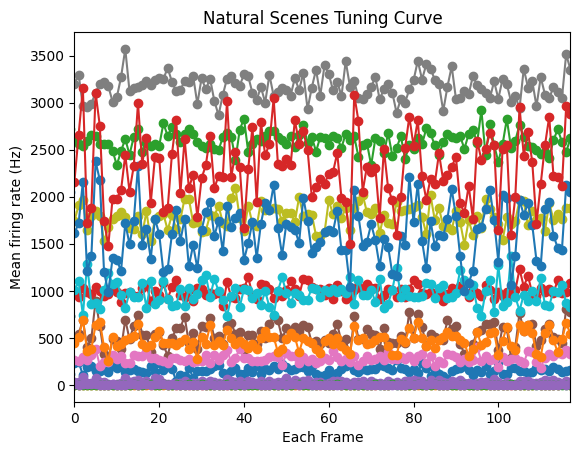

In [19]:
def image_tuning_curve(neuron_indices, spike_times, stimulus_table, time_before=0.1, time_after=0.3):
    # Find the unique stimulus frames presented during the experiment
    unique_frames = np.unique(stimulus_table['frame'].values)
    
    # Print neuron indices
    print(f"Neuron indices: {neuron_indices}")

    # Loop through each neuron index
    for neuron_index in neuron_indices:
        # Get the unit ID for the given neuron index
        unit_id = unit_ids[neuron_index]
        # Retrieve the spike times for the given neuron
        unit_spike_times = spike_times[unit_id]
        
        # Initialize a list to store the mean firing rate for each stimulus frame
        mean_firing_rates = []
    
        # Loop through each unique stimulus frame
        for frame in unique_frames:
            # Create a mask to select rows with the current frame in the stimulus table
            frame_mask = stimulus_table['frame'] == frame
            # Get the presentation start times for the current frame
            presentation_start_times = stimulus_table.loc[frame_mask, 'start_time'].values
            
            # Align the spike times relative to each presentation start time
            aligned_spike_times = [unit_spike_times - t for t in presentation_start_times]
            # Concatenate all aligned spike times into a single array
            all_spikes = np.concatenate(aligned_spike_times)
            
            # Compute the spike counts within the specified time window
            spike_counts, _ = np.histogram(all_spikes, bins=[-time_before, time_after])
            # Calculate the mean firing rate for the current frame
            mean_firing_rate = np.mean(spike_counts) / (time_after - time_before)
            
            # Append the mean firing rate to the list
            mean_firing_rates.append(mean_firing_rate)
    
        # Plot the tuning curve without the neuron index in the label
        plt.plot(unique_frames, mean_firing_rates, marker='o')

    # Label the x-axis and y-axis
    plt.xlabel("Each Frame")
    plt.ylabel("Mean firing rate (Hz)")

    # Add a title to the plot
    plt.title("Natural Scenes Tuning Curve")

    # Set x-axis limits
    plt.xlim(0, unique_frames[-1])

    # Show the plot
    plt.show()

# Example 
image_tuning_curve(np.arange(15), spike_times, stimulus_table)

### Look at the visual stimulus presented for the session.

In [37]:
# Display objects within session.
print('Visual Stimulus for session', session.ecephys_session_id)
pd.unique(session.stimulus_presentations['stimulus_name'])

Visual Stimulus for session 715093703


array(['spontaneous', 'gabors', 'flashes', 'drifting_gratings',
       'natural_movie_three', 'natural_movie_one', 'static_gratings',
       'natural_scenes'], dtype=object)

In [38]:
# Choose the natural scenes portion of the dataset.
natural_scenes = session.stimulus_presentations[session.stimulus_presentations['stimulus_name'] == 'natural_scenes']
np.sort(pd.unique(natural_scenes['frame']))
natural_scenes

,color,contrast,frame,orientation,phase,size,spatial_frequency,start_time,stimulus_block,stimulus_name,stop_time,temporal_frequency,x_position,y_position,duration,stimulus_condition_id
stimulus_presentation_id,,,,,,,,,,,,,,,,
51353,null,null,5.0,null,null,null,null,5892.415053,9.0,natural_scenes,5892.665249,null,null,null,0.250196,4908
51354,null,null,114.0,null,null,null,null,5892.665249,9.0,natural_scenes,5892.915445,null,null,null,0.250196,4909
51355,null,null,13.0,null,null,null,null,5892.915445,9.0,natural_scenes,5893.165641,null,null,null,0.250196,4910
51356,null,null,70.0,null,null,null,null,5893.165641,9.0,natural_scenes,5893.415837,null,null,null,0.250196,4911
51357,null,null,26.0,null,null,null,null,5893.415837,9.0,natural_scenes,5893.666049,null,null,null,0.250211,4912
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68222,null,null,24.0,null,null,null,null,8550.902302,13.0,natural_scenes,8551.152520,null,null,null,0.250219,5006
68223,null,null,107.0,null,null,null,null,8551.152520,13.0,natural_scenes,8551.402739,null,null,null,0.250219,4969
68224,null,null,100.0,null,null,null,null,8551.402739,13.0,natural_scenes,8551.652957,null,null,null,0.250219,4924


2023-04-15 14:56:33,998 allensdk.api.api.retrieve_file_over_http INFO     Downloading URL: http://api.brain-map.org/api/v2/well_known_file_download/514422179


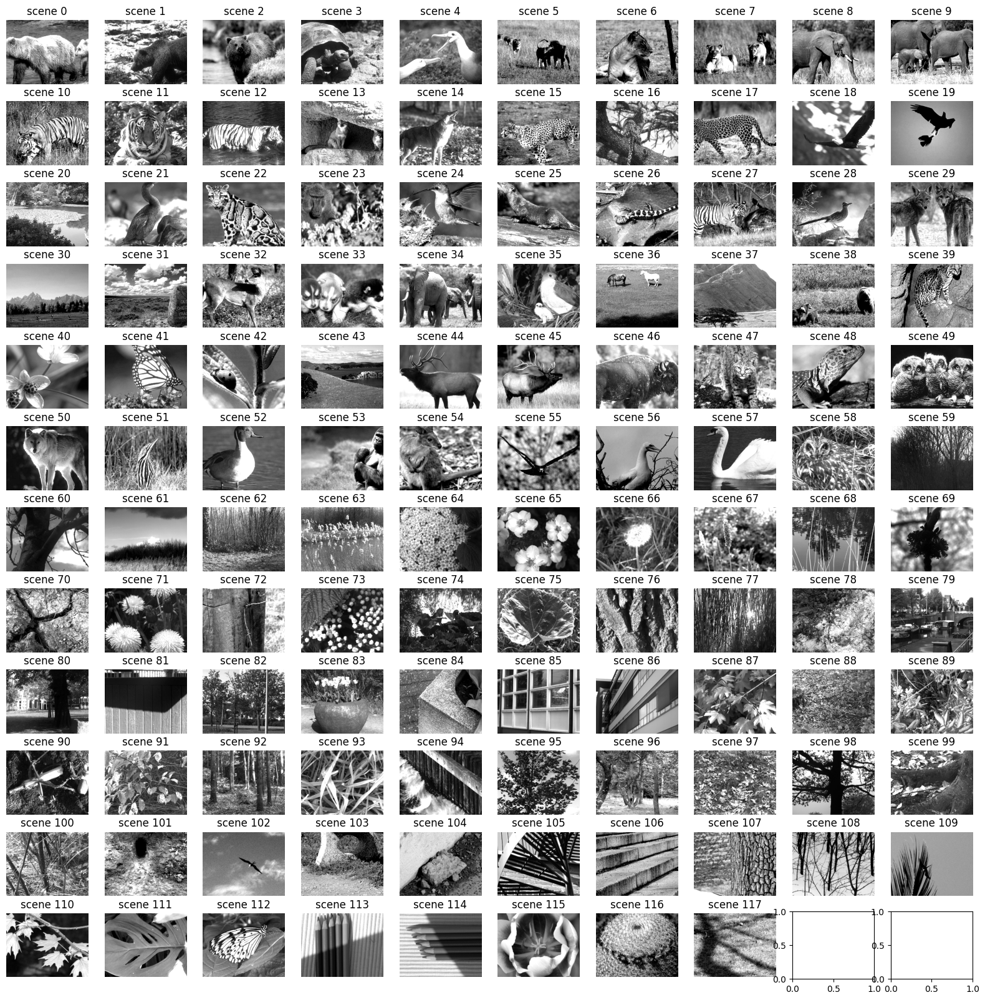

In [39]:
# Pull from where images are located.
boc = BrainObservatoryCache(manifest_file='boc/manifest.json')
data_set = boc.get_ophys_experiment_data(501498760)

# Show all scenes.
scene_nums = np.arange(0)

# read in the array of images
scenes = data_set.get_stimulus_template('natural_scenes')

try:
    fig, axes = plt.subplots(12, 10, figsize=(20, 20))
    for i, ax in enumerate(axes.flat):
        ax.imshow(scenes[i], cmap='gray')
        ax.set_axis_off()
        ax.set_title('scene %d' % i)
except IndexError:
    pass # ignore the IndexError and continue running the code


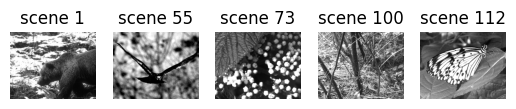

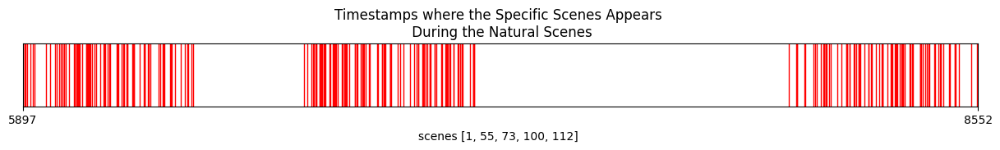

In [40]:
### Choose specific scenes to explore.
scene_nums = [1, 55, 73, 100, 112]

### Thank you to http://alleninstitute.github.io/AllenSDK/_static/examples/nb/brain_observatory_stimuli.html for this chunk.
boc = BrainObservatoryCache(manifest_file='boc/manifest.json')
data_set = boc.get_ophys_experiment_data(501498760)

# read in the array of images
scenes = data_set.get_stimulus_template('natural_scenes')

# Define a function that takes two arguments: a dataframe containing information about stimulus trials and a title for the plot.
# The function plots the times each specified stimulus occurs throught the timeframe.
def plot_stimulus_table(natural_scenes, title):
    fstart = natural_scenes.start_time.min()
    fend = natural_scenes.stop_time.max()
    
    fig = plt.figure(figsize=(15,1))
    ax = fig.gca()
    # Loop over each trial in the dataframe
    for i, trial in natural_scenes.iterrows():    
        # Calculate the start and stop times for the trial.
        x1 = float(trial.start_time - fstart) / (fend - fstart)
        x2 = float(trial.stop_time - fstart) / (fend - fstart)      
        # Add a rectangle to the plot.
        ax.add_patch(patches.Rectangle((x1, 0.0), x2 - x1, 1.0, color='r'))
        
    ax.set_xticks((0,1))
    ax.set_xticklabels((int(np.round(fstart)), int(np.round(fend))))
    ax.set_yticks(())
    ax.set_title("Timestamps where the Specific Scenes Appears \n During the Natural Scenes")
    ax.set_xlabel(title)

# read in the array of images
scenes = data_set.get_stimulus_template('natural_scenes')

# display a couple of the scenes
fig, axes = plt.subplots(1,len(scene_nums))
for ax,scene in zip(axes, scene_nums):
    ax.imshow(scenes[scene,:,:], cmap='gray')
    ax.set_axis_off()
    ax.set_title('scene %d' % scene)
    
# build up a mask of trials for which one of a list of scenes is visible
trial_mask = natural_scenes.frame == -2
for scene in scene_nums:
    trial_mask |= (natural_scenes.frame == scene)
natural_scenes = natural_scenes[trial_mask]

# plot the trials
plot_stimulus_table(natural_scenes, "scenes %s " % scene_nums)

### Visualize Single Neuron Firing Patterns

Run step 1 before running the following cell.

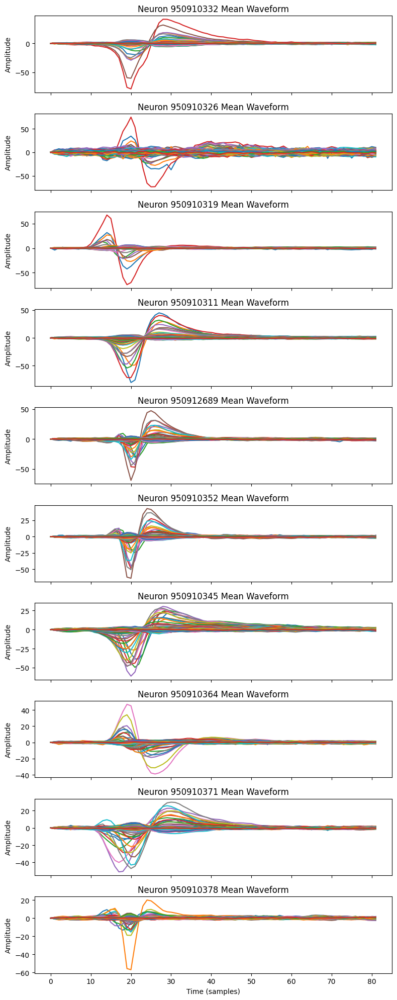

In [9]:
# Get the mean spike waveforms for each neuron
mean_waveforms = session.mean_waveforms

# Number of waveforms to display (you can change this value)
n_waveforms = 10
unit_ids = session.units.index.values

# Plot the mean spike waveforms for the first n_waveforms neurons
fig, axes = plt.subplots(n_waveforms, 1, figsize=(8, 2 * n_waveforms), sharex=True)
for i, (unit_id, ax) in enumerate(zip(unit_ids[:n_waveforms], axes)):
    waveform = mean_waveforms[unit_id]
    ax.plot(waveform.T)
    ax.set_title(f'Neuron {unit_id} Mean Waveform')
    ax.set_ylabel('Amplitude')
    ax.label_outer()

plt.xlabel('Time (samples)')
plt.tight_layout()
plt.show()


### Build Raster Plot

Run step 1 before running the following cell.

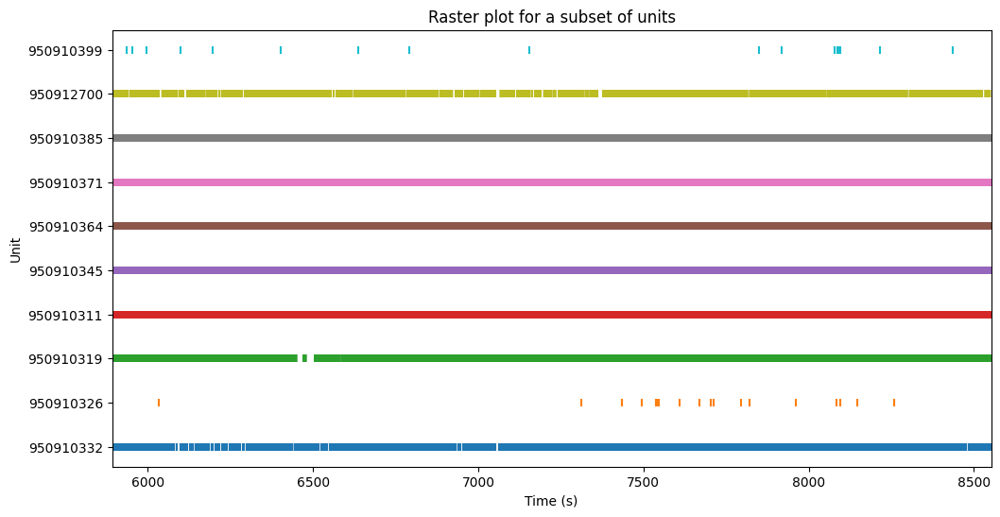

The following is the first 1000 timesteps of the data visualized. 1/30,000th of a second.
[0 1]


,950910332,950910326,950910319,950910311,950910345,950910364,950910371,950910385,950912700,950910399
Time (s),,,,,,,,,,
5892.415053,0,0,0,0,0,0,0,0,0,0
5892.415086,0,0,0,0,0,0,0,0,0,0
5892.415120,0,0,0,0,0,0,0,0,0,0
5892.415153,0,0,0,0,0,0,0,0,0,0
5892.415186,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
5892.448186,0,0,0,0,0,0,0,0,0,0
5892.448220,0,0,0,0,0,0,0,0,0,0
5892.448253,0,0,0,0,0,0,0,0,0,0


In [17]:
natural_scenes = session.stimulus_presentations[session.stimulus_presentations['stimulus_name'] == 'natural_scenes']
available_unit_ids = session.spike_times.keys()
all_spike_times = {unit_id: session.spike_times[unit_id] for unit_id in available_unit_ids}
units = cache.get_units()

# Create a function to build a raster plot.
def visualize_spike_data(num_units_to_visualize, all_spike_times, units, start_time=0, end_time=10, num_timesteps=30):
    # Select a subset of units to plot
    available_unit_ids = list(all_spike_times.keys())
    subset_unit_ids = available_unit_ids[:num_units_to_visualize]

    # Calculate the time_interval (in seconds) from the first unit's sampling rate
    time_interval = 1 / units.iloc[0]['sampling_rate']

    # Create the raster plot
    fig, ax = plt.subplots(figsize=(12, 6))

    for i, unit_id in enumerate(subset_unit_ids):
        spike_times = all_spike_times[unit_id]

        # Filter the spike times based on start_time and end_time
        filtered_spike_times = [t for t in spike_times if start_time <= t <= end_time]

        ax.scatter(filtered_spike_times, [i] * len(filtered_spike_times), marker='|')

    ax.set_xlim([start_time, end_time])
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Unit')
    ax.set_yticks(range(len(subset_unit_ids)))
    ax.set_yticklabels(subset_unit_ids)
    ax.set_title('Raster plot for a subset of units')

    plt.show()

    # Create an array of time bins
    time_bins = np.arange(start_time, start_time + num_timesteps, time_interval)

    # Only consider the first 'num_timesteps' time bins
    time_bins = time_bins[:num_timesteps]

    # Initialize an empty DataFrame with the time bins as the index
    spike_counts_df = pd.DataFrame(index=time_bins[:-1])

    # Iterate through the units and count the spikes in each time bin
    for unit_id in subset_unit_ids:
        spike_times = all_spike_times[unit_id]
        spike_counts, _ = np.histogram(spike_times, bins=time_bins)
        spike_counts_df[unit_id] = spike_counts

    # Rename the index
    spike_counts_df.index.name = 'Time (s)'

    return spike_counts_df

# Example usage:
num_units_to_visualize = 10
start_time = natural_scenes.start_time.min()
end_time = natural_scenes.stop_time.max()
num_timesteps = 1000

spike_counts_df = visualize_spike_data(num_units_to_visualize, all_spike_times, units, start_time, end_time, num_timesteps)
print('The following is the first 1000 timesteps of the data visualized. 1/30,000th of a second.')
print(np.unique(spike_counts_df))
spike_counts_df

### Build Grouped Correlation Matrix

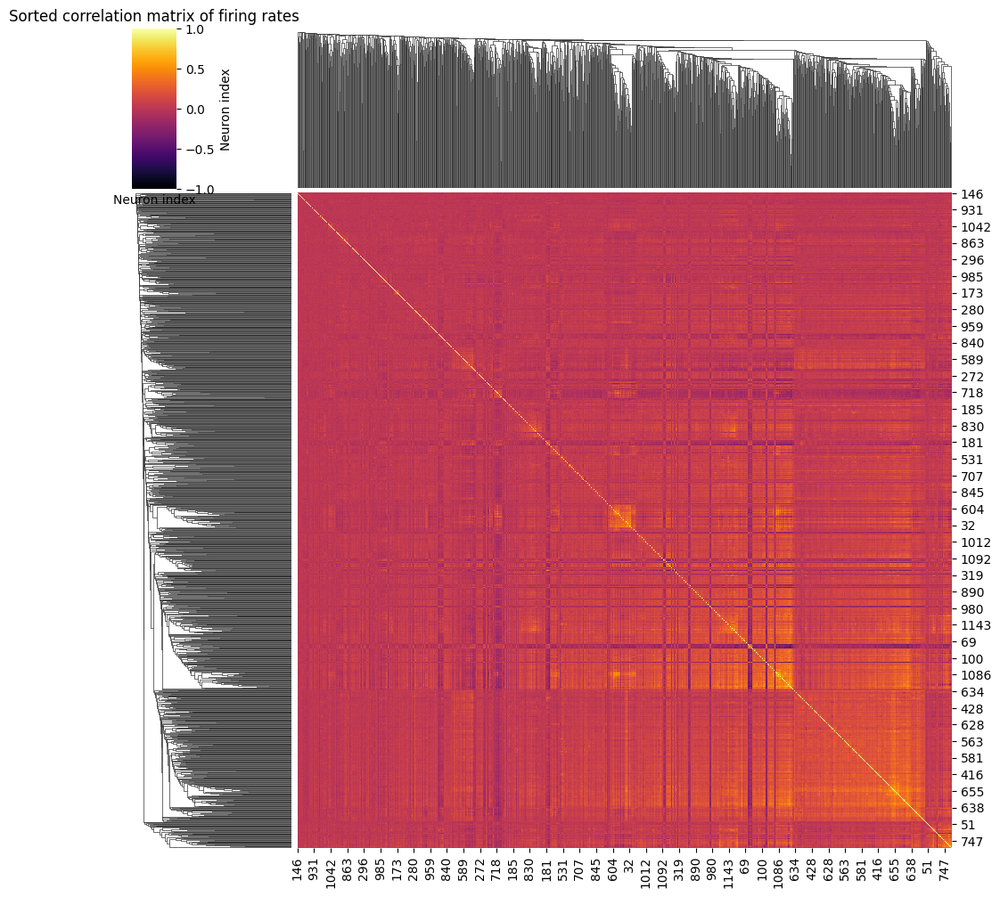

In [16]:
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist, squareform

X = filtered_normalized_firing_rates.drop(columns=['frame'])

### This function calculates the correlation coefficient between each pair of neurons in the input matrix X (in our case, firing rates).
def custom_corrcoef(X):
    # Calculate the correlation coefficient matrix by taking the dot product of the normalized matrix and its transpose
    # Divide the result by the number of columns in X to normalize the sum
    return np.dot(X, X.T) / X.shape[1]

# Calculate the correlation matrix
corr_matrix = custom_corrcoef(X.T)

# Compute the hierarchical clustering
distance_matrix = 1 - np.abs(corr_matrix)
np.fill_diagonal(distance_matrix, 0)  # Set the diagonal to zero
linked = linkage(squareform(distance_matrix), method='average') 

# Plot the heatmap with dendrogram-based sorting
sns.clustermap(corr_matrix, cmap='inferno', row_linkage=linked, col_linkage=linked, vmin=-1, vmax=1)
plt.title("Sorted correlation matrix of firing rates")
plt.xlabel("Neuron index")
plt.ylabel("Neuron index")
plt.show()

### Show grouped neurons with heat maps.

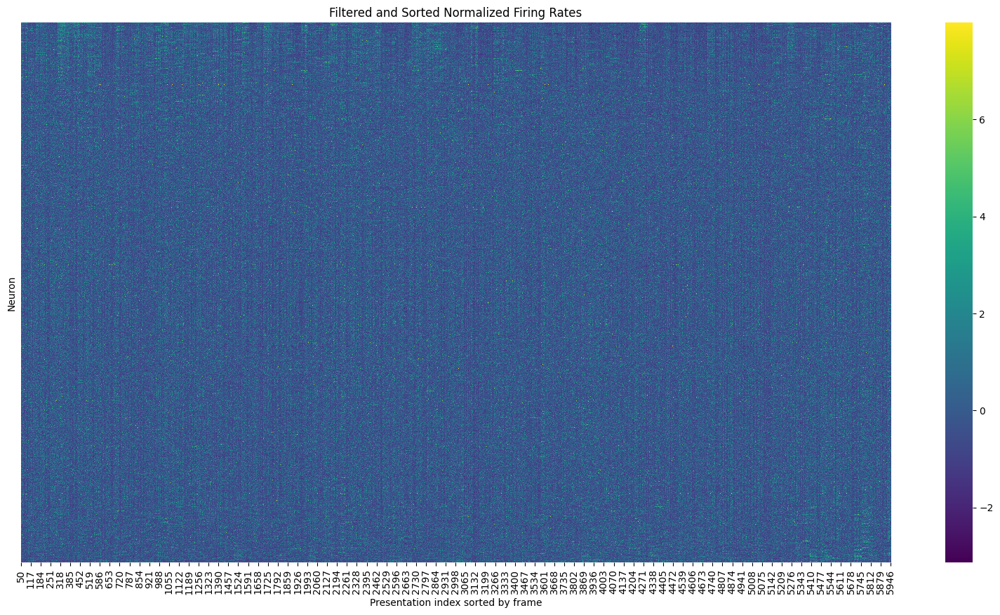

In [4]:
def plot_filtered_normalized_firing_rates(df, num_frames):
    # Calculate the correlation between the firing rates and frames
    correlation_matrix = df.corrwith(df['frame'], method='spearman')

    # Sort neurons by their correlation with the 'frame' column
    sorted_neurons = correlation_matrix[df.columns[1:]].sort_values().index.tolist()

    # Filter the DataFrame based on the desired number of frames
    filtered_df = df.head(num_frames)

    # Sort neurons by their correlation with the 'frame' column
    sorted_filtered_df = filtered_df[['frame'] + sorted_neurons]

    # Create a heatmap for the filtered and sorted DataFrame
    plt.figure(figsize=(20, 10))
    sns.heatmap(sorted_filtered_df.iloc[:, 1:].T, cmap='viridis', yticklabels=False)
    plt.xlabel('Presentation index sorted by frame')
    plt.ylabel('Neuron')
    plt.title('Filtered and Sorted Normalized Firing Rates')
    plt.show()

# Use the function with the desired parameters
plot_filtered_normalized_firing_rates(filtered_normalized_firing_rates, num_frames=None)

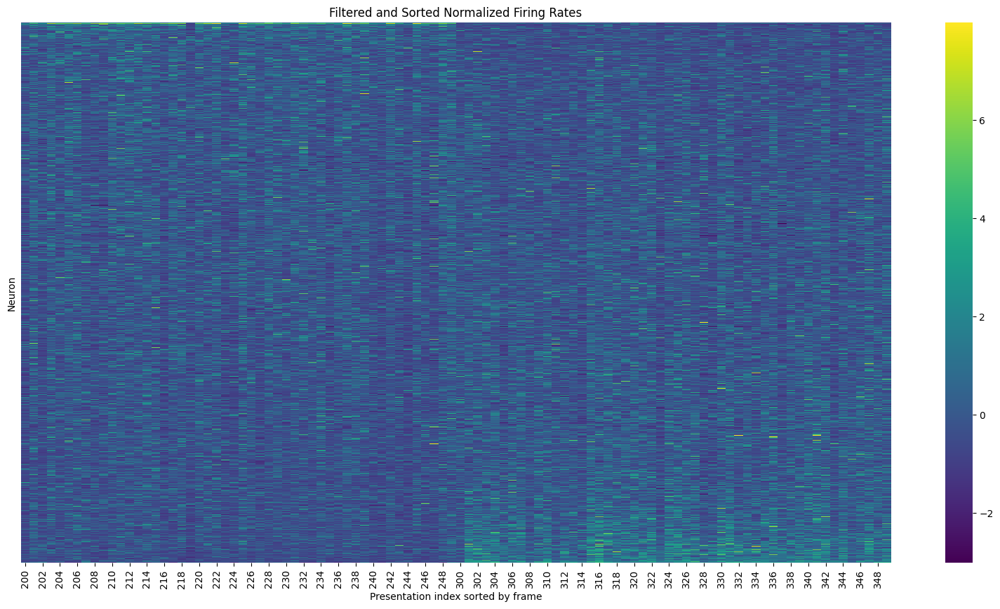

In [29]:
# select only frames 0, 1, 2, 3, 4, 5
frames_to_select = [3,5]
select_images = filtered_normalized_firing_rates[filtered_normalized_firing_rates['frame'].isin(frames_to_select)]
select_images

plot_filtered_normalized_firing_rates(select_images, num_frames=None)

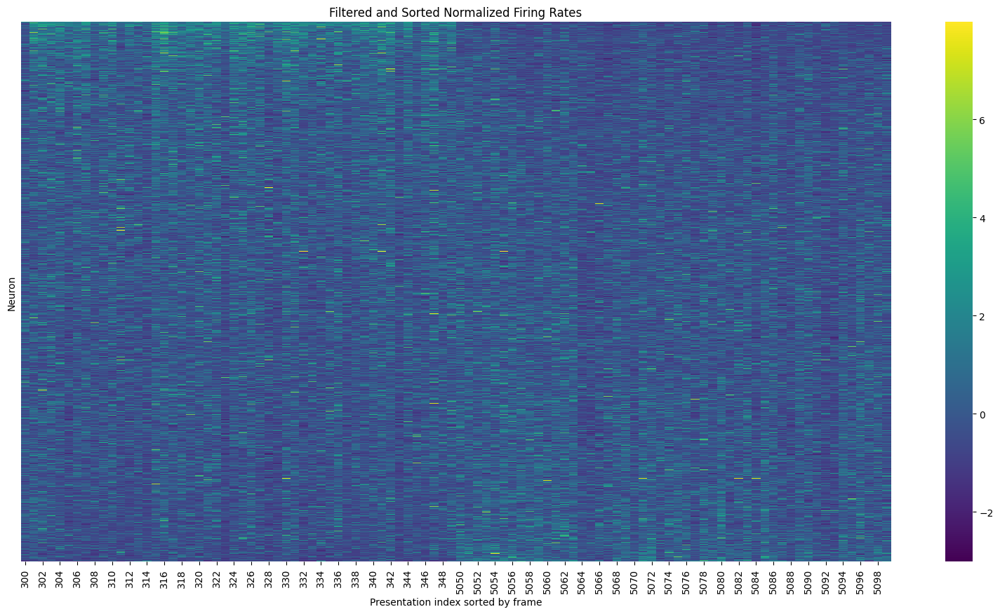

In [30]:
# select only frames 0, 1, 2, 3, 4, 5
frames_to_select = [5,100]
select_images = filtered_normalized_firing_rates[filtered_normalized_firing_rates['frame'].isin(frames_to_select)]
select_images

plot_filtered_normalized_firing_rates(select_images, num_frames=None)

### Build a t-SNE Plots.

In [26]:
### Pre-process for t-SNE.

# Drop the 'frame' column and convert the DataFrame to a NumPy array
avg_firing_rates_np = filtered_normalized_firing_rates.drop(columns=['frame']).values

# Define Carolina blue color (in RGB format)
carolina_blue = (86/255, 160/255, 211/255)

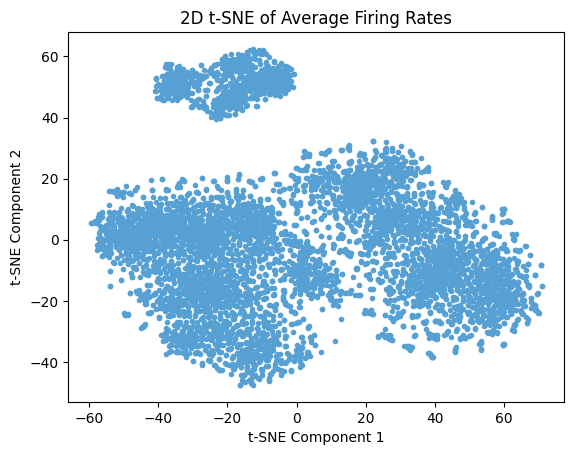

In [34]:
# Perform 2D t-SNE.
tsne_2d = TSNE(n_components=2, random_state=42)
tsne_2d_results = tsne_2d.fit_transform(avg_firing_rates_df.values)

# Plot 2D t-SNE with Carolina blue color
plt.scatter(tsne_2d_results[:, 0], tsne_2d_results[:, 1], color=carolina_blue, marker='.')
plt.title('2D t-SNE of Average Firing Rates')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

In [36]:
print('Show data that built graph above')
avg_firing_rates_df

Show data that built graph above


,frame,950910332,950910326,950910319,950910311,950910345,950910364,950910371,950910385,950912700,...,950956514,950956813,950957408,950956802,950956835,950956858,950956845,950956952,950957020,950957004
0,5.0,0.0,0.0,35.971778,11.990593,3.996864,19.984321,19.984321,23.981185,0.0,...,3.996864,11.990593,0.0,11.990593,11.990593,19.984321,0.0,39.968642,3.996864,0.0
1,114.0,0.0,0.0,19.984321,0.000000,3.996864,39.968642,3.996864,19.984321,0.0,...,3.996864,0.000000,0.0,0.000000,7.993728,0.000000,0.0,59.952963,0.000000,0.0
2,13.0,0.0,0.0,19.984321,3.996864,0.000000,23.981185,3.996864,3.996864,0.0,...,0.000000,0.000000,0.0,0.000000,3.996864,0.000000,0.0,35.971778,7.993728,0.0
3,70.0,0.0,0.0,19.984321,11.990593,7.993728,31.974914,3.996864,3.996864,0.0,...,0.000000,0.000000,0.0,7.993728,7.993728,7.993728,0.0,91.927877,15.987457,0.0
4,26.0,0.0,0.0,7.993242,3.996621,7.993242,15.986484,15.986484,23.979727,0.0,...,0.000000,11.989863,0.0,0.000000,0.000000,3.996621,0.0,27.976348,3.996621,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5945,24.0,0.0,0.0,27.975534,0.000000,0.000000,19.982524,15.986019,0.000000,0.0,...,3.996505,0.000000,0.0,11.989514,0.000000,0.000000,0.0,19.982524,7.993010,0.0
5946,107.0,0.0,0.0,31.972039,3.996505,3.996505,39.965048,19.982524,7.993010,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,3.996505,0.0,27.975534,0.000000,0.0
5947,100.0,0.0,0.0,23.979029,3.996505,3.996505,39.965048,15.986019,3.996505,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,23.979029,0.000000,0.0
5948,76.0,0.0,0.0,35.969949,3.996661,0.000000,7.993322,11.989983,0.000000,0.0,...,0.000000,0.000000,0.0,3.996661,0.000000,7.993322,0.0,15.986644,3.996661,0.0


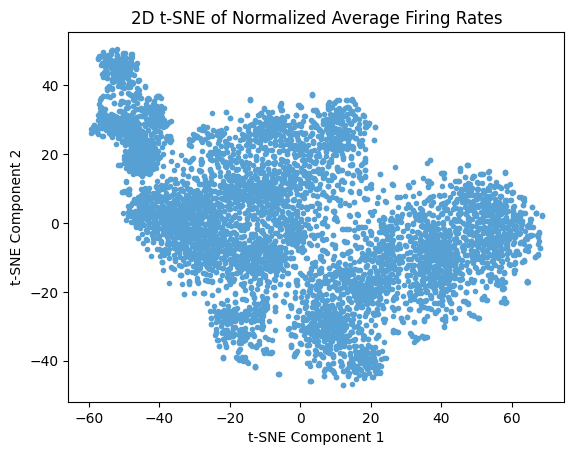

In [28]:
# Perform 2D t-SNE.
tsne_2d = TSNE(n_components=2, random_state=69)
tsne_2d_results = tsne_2d.fit_transform(avg_firing_rates_np)

# Plot 2D t-SNE with Carolina blue color
plt.scatter(tsne_2d_results[:, 0], tsne_2d_results[:, 1], color=carolina_blue, marker='.')
plt.title('2D t-SNE of Normalized Average Firing Rates')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

In [37]:
print('Show data that built graph above')
pd.DataFrame(avg_firing_rates_np)

Show data that built graph above


,0,1,2,3,4,5,6,7,8,9,...,1134,1135,1136,1137,1138,1139,1140,1141,1142,1143
0,1.216980,0.327071,0.350065,-0.891987,0.244950,0.032200,-0.709567,1.333528,-0.879337,0.339835,...,-0.317543,-0.916082,0.319112,-0.798024,-0.610724,0.500937,-0.418983,-1.007000,-0.024861,0.187593
1,-0.723697,-1.617677,0.350065,0.646800,-1.617741,-0.130748,-0.709567,-0.638825,0.431688,-0.708673,...,-0.317543,-0.458522,-1.258703,0.913586,-0.610724,1.409815,-0.418983,1.055341,0.844652,1.149820
2,-0.723697,-0.969428,-0.829334,-0.584230,-1.617741,-0.782542,-0.709567,-1.296276,-0.442329,0.339835,...,1.012098,-0.458522,-0.469795,-0.798024,-0.610724,-0.862379,-0.418983,1.055341,-0.894373,-0.004852
3,-0.723697,0.327071,1.529464,0.031285,-1.617741,-0.782542,-0.709567,0.018626,-0.442329,0.339835,...,-0.982364,-0.000961,-1.258703,0.057781,1.019430,4.136448,0.920924,2.430235,0.844652,2.689384
4,-2.179263,-0.969467,1.529321,-1.199820,-0.220836,0.032141,-0.709567,0.675917,-0.005559,-0.708673,...,-0.982404,-0.458549,-1.258703,0.913481,0.204303,-0.407968,-0.418983,0.367811,-0.894373,-0.389825
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5895,0.246336,-1.617677,-0.829334,-0.892126,-0.220890,-0.945490,-0.709567,0.018449,1.742202,-0.708673,...,-0.317663,-0.001043,1.107807,-0.798024,0.204280,-0.407981,0.920803,0.367771,-0.894373,-0.774720
5896,0.731462,-0.969486,0.349959,0.646523,0.244741,-0.619622,-0.709567,-0.638943,0.868264,-0.708673,...,-1.647185,-0.916082,1.107807,-0.798024,-0.610724,-0.407981,0.920803,0.367771,-0.459656,-0.389864
5897,-0.238789,-0.969486,0.349959,0.646523,-0.220890,-0.782556,-0.709567,-0.638943,0.431295,-0.708673,...,-0.982424,-0.458563,0.318970,-0.798024,-0.610724,-0.862379,-0.418983,0.367771,-0.894373,-0.582292
5898,1.216758,-0.969461,-0.829334,-1.815291,-0.686466,-0.945490,-0.709567,0.018526,1.305438,-0.708673,...,0.347176,-0.458545,-0.469836,0.057737,-0.610724,-0.862379,-0.418983,-0.319588,-0.459639,-0.967118


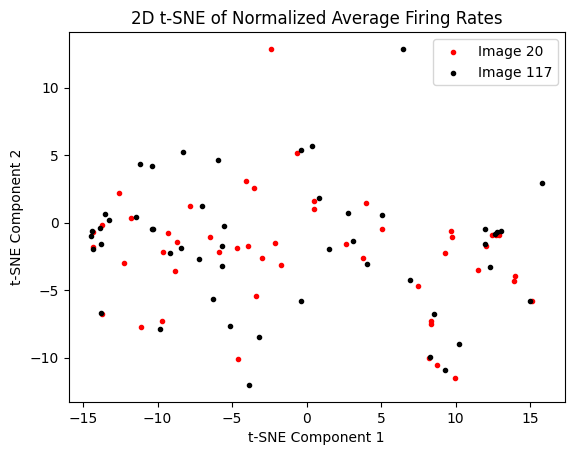

In [21]:
# Your data
data = filtered_normalized_firing_rates# Replace with your data

# Replace 'frame_column_name' with the actual column name in your dataframe
frame_column_name = 'frame'

# List of frames you want to include
frames_to_include = [20, 117]

# Filter the dataframe based on the list of frames
filtered_data = data[data[frame_column_name].isin(frames_to_include)]

# Get unique frame values and their corresponding indices in the filtered dataframe
unique_frames, frame_indices = np.unique(filtered_data[frame_column_name], return_inverse=True)

# Drop the frame column and transpose the dataframe
filtered_data_no_frame = filtered_data.drop(frame_column_name, axis=1).T

# Convert the dataframe to a NumPy array
avg_firing_rates_np = filtered_data_no_frame.to_numpy()

# Perform 2D t-SNE
tsne_2d = TSNE(n_components=2, random_state=42069)
tsne_2d_results = tsne_2d.fit_transform(avg_firing_rates_np)

# Create a colormap with as many colors as unique frames
colormap = plt.cm.get_cmap('flag', len(frames_to_include))

# Plot 2D t-SNE with different colors for each unique frame
for frame_idx, frame in enumerate(unique_frames):
    indices = np.where(frame_indices == frame_idx)
    plt.scatter(tsne_2d_results[indices, 0], tsne_2d_results[indices, 1], color=colormap(frame_idx), marker='.', label=f"Image {int(frame)}")

# Set up the legend
plt.legend()

# Set up labels and title
plt.title('2D t-SNE of Normalized Average Firing Rates')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')

# Show the plot
plt.show()


KeyboardInterrupt: 

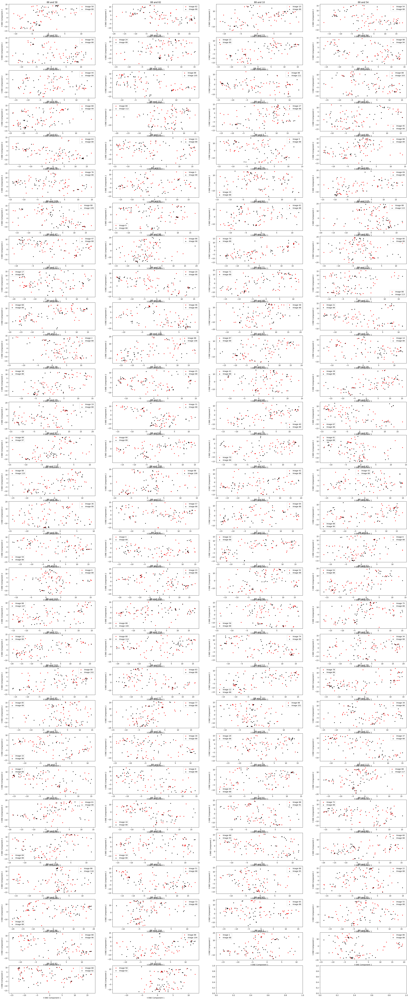

In [23]:
import itertools

data = filtered_normalized_firing_rates
unique_frames_list = data['frame'].unique()

fig, axs = plt.subplots(nrows=30, ncols=4, figsize=(40, 100))
axs = axs.flatten()

for i, frames_to_include in enumerate(itertools.combinations(unique_frames_list, 2)):
    filtered_data = data[data['frame'].isin(frames_to_include)]
    unique_frames, frame_indices = np.unique(filtered_data['frame'], return_inverse=True)
    filtered_data_no_frame = filtered_data.drop('frame', axis=1).T

    tsne_2d = TSNE(n_components=2, random_state=42069)
    tsne_2d_results = tsne_2d.fit_transform(filtered_data_no_frame.to_numpy())

    colormap = plt.cm.get_cmap('flag', len(frames_to_include))

    for frame_idx, frame in enumerate(unique_frames):
        indices = np.where(frame_indices == frame_idx)
        axs[i].scatter(tsne_2d_results[indices, 0], tsne_2d_results[indices, 1], color=colormap(frame_idx), marker='.', label=f"Image {int(frame)}")

    axs[i].legend()
    axs[i].set_title(f'{int(frames_to_include[0])} and {int(frames_to_include[1])}')
    axs[i].set_xlabel('t-SNE Component 1')
    axs[i].set_ylabel('t-SNE Component 2')

plt.tight_layout()
plt.show()

### Build UMAP plots.

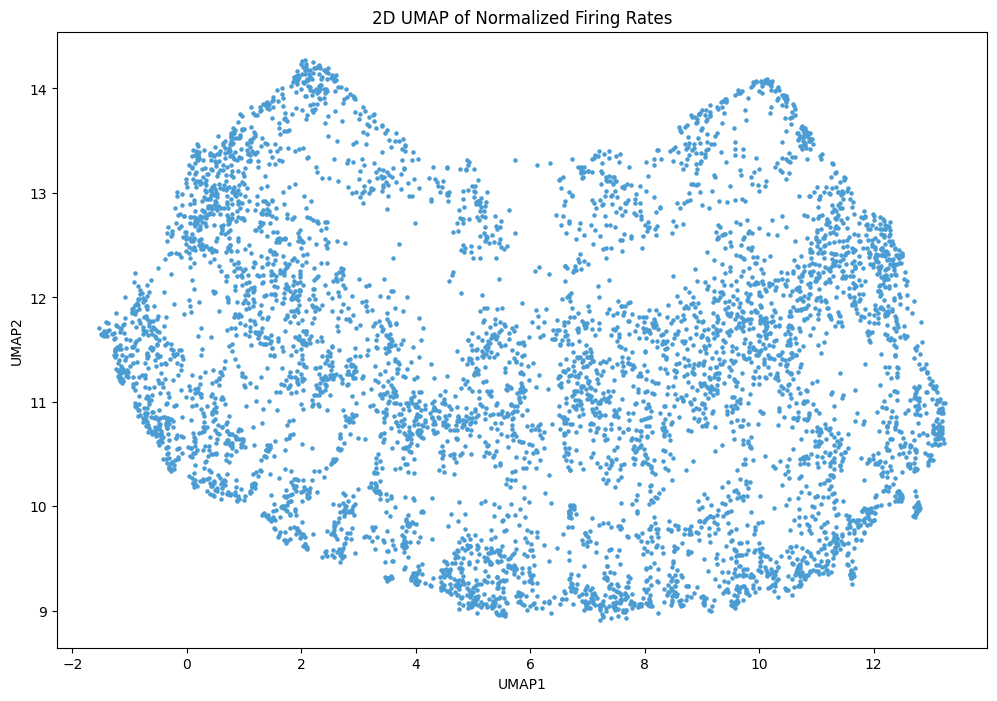

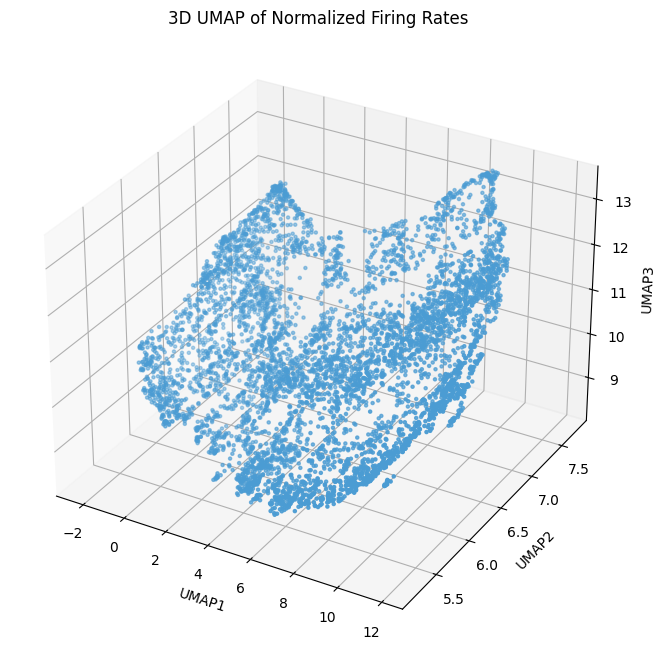

In [39]:
# Create a UMAP reducer for 2D
reducer_2d = umap.UMAP(n_components=2, random_state=42)
embedding_2d = reducer_2d.fit_transform(filtered_normalized_firing_rates)

# Create a UMAP reducer for 
reducer_3d = umap.UMAP(n_components=3, random_state=42)
embedding_3d = reducer_3d.fit_transform(filtered_normalized_firing_rates)

# Plot the 2D UMAP
plt.figure(figsize=(12, 8))
plt.scatter(embedding_2d[:, 0], embedding_2d[:, 1], s=5, c='#4B9CD3')
plt.title('2D UMAP of Normalized Firing Rates')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.show()

# Plot the 3D UMAP
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(embedding_3d[:, 0], embedding_3d[:, 1], embedding_3d[:, 2], s=5, c='#4B9CD3')
ax.set_title('3D UMAP of Normalized Firing Rates')
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_zlabel('UMAP3')
plt.show()


<a name="step4content"></a>
## 4. Image Prediction Modeling

(Put the content for Step 4 here)

### Only run if testing x, y, and z's as new inputs.

In [ ]:
### Ignore this if not testing x, y, and z's as new inputs.
# For testing x, y, z as new inputs for each neuron.
filtered_normalized_firing_rates_xyz = filtered_normalized_firing_rates.copy()

for unit_num in normalized_xyz['Unit Number']:
    x_val = normalized_xyz.loc[normalized_xyz['Unit Number']==unit_num]['X'].values[0]
    y_val = normalized_xyz.loc[normalized_xyz['Unit Number']==unit_num]['Y'].values[0]
    z_val = normalized_xyz.loc[normalized_xyz['Unit Number']==unit_num]['Z'].values[0]
    
    # Create a new DataFrame with the new columns and concatenate with the copy of the original DataFrame
    new_cols = pd.DataFrame({
        f'x_{unit_num}': [x_val] * len(filtered_normalized_firing_rates_xyz),
        f'y_{unit_num}': [y_val] * len(filtered_normalized_firing_rates_xyz),
        f'z_{unit_num}': [z_val] * len(filtered_normalized_firing_rates_xyz)
    })
    filtered_normalized_firing_rates_xyz = pd.concat([filtered_normalized_firing_rates_xyz, new_cols], axis=1)

### Set up for training.
# Create X and y from the filtered_normalized_firing_rates
y = filtered_normalized_firing_rates_xyz['frame']
X = filtered_normalized_firing_rates_xyz.drop(columns=['frame'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)

# One-hot encode the target variable
num_classes = len(np.unique(y))
y_encoded = to_categorical(y)

### Baseline
The baseline accuracy is the same as randomly guessing what image appears.

In [9]:
filtered_normalized_firing_rates = filtered_normalized_firing_rates.sample(frac=1).reset_index(drop=True)

### Set up for training.
# Create X and y from the filtered_normalized_firing_rates
y = filtered_normalized_firing_rates['frame']
X = filtered_normalized_firing_rates.drop(columns=['frame'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)

# One-hot encode the target variable
num_classes = len(np.unique(y))
y_encoded = to_categorical(y)

print(f'Accuracy:{ np.round(1/117, 2)}%')

Accuracy:0.01%


### SVM with a Radial Kernel

In [42]:
# Split the dataset into training (70%) and testing (30%) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create and train the SVM model with a radial kernel
model = SVR(kernel='rbf', C=1.0, gamma='scale')
model.fit(X_train, y_train)

# Make predictions on the test set and round them to the nearest integer
y_pred = model.predict(X_test)
y_pred_rounded = [round(pred) for pred in y_pred]

# Calculate the accuracy of the model
correct_predictions = sum(y_test == y_pred_rounded)
accuracy = correct_predictions / len(y_test) * 100
print(f"Accuracy: {accuracy:.2f}%")

# Calculate the mean squared error between the true and predicted values
mse = mean_squared_error(y_test, y_pred)
RMSE = np.sqrt(mse)
print(f"Root Mean Squared Error: {RMSE}")

Accuracy: 1.81%
Root Mean Squared Error: 33.54463497887232


### Run Principal Component Regression 

In [43]:
### A basic PCR.
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Create a pipeline for PCR
n_components = 10  # Adjust the number of components based on your data
pcr = Pipeline([
    ('pca', PCA(n_components=n_components)),
    ('linear_regression', LinearRegression())
])

# Train the PCR model
pcr.fit(X_train, y_train)

# Predict the test set
y_pred = pcr.predict(X_test)

# Convert predictions and true labels to integers (since you mentioned that each number represents a picture)
y_pred_int = np.round(y_pred).astype(int)
y_test_int = y_test.astype(int)

# Calculate the accuracy
accuracy = accuracy_score(y_test_int, y_pred_int)
print("PCR accuracy:", np.round(accuracy, 3))

PCR accuracy: 0.007


### Train NN

### Top Model

In [24]:
# Top simple neural net.
def train_and_evaluate_nn_keras(X, y, highest_value, lowest_value, split_size, num_of_neurons_in_dense, activation_fn, batch_size):
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = split_size, random_state=42)

    # Create the neural network
    model = Sequential()
    model.add(Dense(num_of_neurons_in_dense, input_dim=X_train.shape[1], activation=activation_fn))
    model.add(Dense(num_classes, activation='softmax'))

    # Compile the model
    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

    # Train the neural network
    model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0)

    # Evaluate the model on the test set
    _, accuracy = model.evaluate(X_test, y_test, verbose=0)

    return print(f'Model Accuracy:{np.round(accuracy*100,2)}%')

# Run function. 
train_and_evaluate_nn_keras(X, y_encoded, 8, 1, .2, 250, 'sigmoid', 64)

Model Accuracy:87.54%


Model Accuracy:88.73%


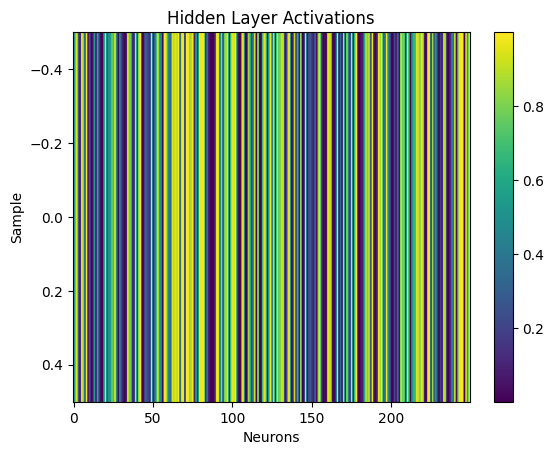

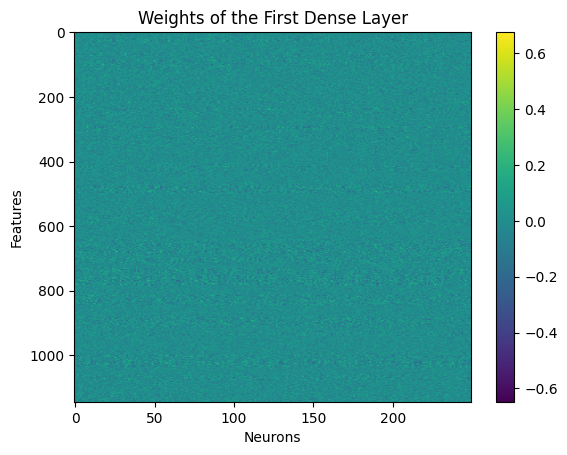

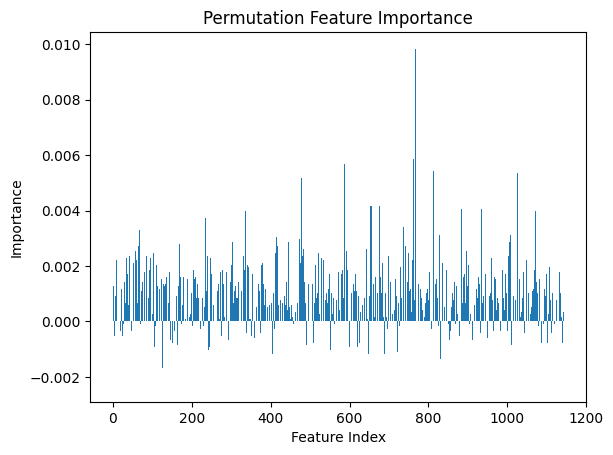

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

def create_model(num_of_neurons_in_dense=250, activation_fn='sigmoid'):
    model = Sequential()
    model.add(Dense(num_of_neurons_in_dense, input_dim=X_train.shape[1], activation=activation_fn))
    model.add(Dense(num_classes, activation='softmax'))
    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

def train_and_evaluate_nn_keras(X, y, highest_value, lowest_value, split_size, num_of_neurons_in_dense, activation_fn, batch_size):
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = split_size, random_state=42)

    # Create the Keras classifier
    keras_clf = KerasClassifier(build_fn=create_model, num_of_neurons_in_dense=num_of_neurons_in_dense,
                                activation_fn=activation_fn, batch_size=batch_size, epochs=200, verbose=0)
    keras_clf.fit(X_train, y_train)

    # Evaluate the model on the test set
    accuracy = keras_clf.score(X_test, y_test)

    print(f'Model Accuracy:{np.round(accuracy*100,2)}%')

    # Visualize the activations
    model = keras_clf.model
    activation_model = Model(inputs=model.input, outputs=model.layers[0].output)
    sample_input = X_test[0:1]
    activations = activation_model.predict(sample_input)

    plt.imshow(activations, cmap='viridis', aspect='auto')
    plt.xlabel('Neurons')
    plt.ylabel('Sample')
    plt.title('Hidden Layer Activations')
    plt.colorbar()
    plt.show()

    # Visualize the weights
    weights, biases = model.layers[0].get_weights()
    plt.imshow(weights, cmap='viridis', aspect='auto')
    plt.xlabel('Neurons')
    plt.ylabel('Features')
    plt.title('Weights of the First Dense Layer')
    plt.colorbar()
    plt.show()

    # Compute the permutation importances
    result = permutation_importance(keras_clf, X_test, y_test, n_repeats=10, random_state=42)

    # Visualize the feature importances
    plt.bar(range(X_test.shape[1]), result.importances_mean)
    plt.xlabel('Feature Index')
    plt.ylabel('Importance')
    plt.title('Permutation Feature Importance')
    plt.show()

# Run function
train_and_evaluate_nn_keras(X, y_encoded, 8, 1, .2, 250, 'sigmoid', 64)


### Testing

In [11]:
def test_nn(X, y, highest_value, lowest_value, split_size, num_of_neurons_in_dense, activation_fn, batch_size):
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = split_size, random_state=42)

    # Create the neural network
    model = Sequential()
    model.add(Dense(num_of_neurons_in_dense, input_dim=X_train.shape[1], activation=activation_fn))
    model.add(Dense(num_classes, activation='softmax'))

    # Compile the model
    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

    # Train the neural network
    model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0)

    # Evaluate the model on the test set
    _, accuracy = model.evaluate(X_test, y_test, verbose=0)

    return print(f'Model Accuracy:{np.round(accuracy*100,2)}%')

# Run function. 
test_nn(X, y_encoded, 8, 1, .2, 250, 'sigmoid', 64)

Model Accuracy:87.88%


In [12]:
test_nn(X, y_encoded, 8, 1, .2, 1000, 'sigmoid', 64)

Model Accuracy:88.81%


In [13]:
test_nn(X, y_encoded, 8, 1, .2, 8000, 'sigmoid', 64)

Model Accuracy:87.97%


In [14]:
test_nn(X, y_encoded, 8, 1, .2, 10000, 'sigmoid', 64)

Model Accuracy:87.54%


In [15]:
def test_nn(X, y, highest_value, lowest_value, split_size, num_of_neurons_in_dense, activation_fn, batch_size):
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = split_size, random_state=42)

    # Create the neural network
    model = Sequential()
    model.add(Dense(250, input_dim=X_train.shape[1], activation=activation_fn))
    model.add(Dense(117, input_dim=X_train.shape[1], activation=activation_fn))
    model.add(Dense(num_classes, activation='softmax'))

    # Compile the model
    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

    # Train the neural network
    model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0)

    # Evaluate the model on the test set
    _, accuracy = model.evaluate(X_test, y_test, verbose=0)

    return print(f'Model Accuracy:{np.round(accuracy*100,2)}%')

# Run function. 
test_nn(X, y_encoded, 8, 1, .2, 250, 'sigmoid', 64)

Model Accuracy:81.86%


### Iterate through z-score threshold values.

In [19]:
def train_and_evaluate_nn_keras(X, y, highest_value, lowest_value, split_size, num_neurons):
    # Filter the dataset based on the highest_value and lowest_value
    selected_neurons_mask = (~(X > highest_value).any(axis=0)) & ((X > lowest_value).any(axis=0))
    X_filtered = X.loc[:, selected_neurons_mask]

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X_filtered, y, test_size=split_size, random_state=42)

    # Create the neural network
    model = Sequential()
    model.add(Dense(num_neurons, input_dim=X_train.shape[1], activation='sigmoid'))
    model.add(Dense(num_classes, activation='softmax'))

    # Compile the model
    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

    # Train the neural network
    model.fit(X_train, y_train, epochs=200, batch_size=64, verbose=0)

    # Evaluate the model on the test set
    _, accuracy = model.evaluate(X_test, y_test, verbose=0)

    return accuracy

print(f'Model Accuracy: {np.round(train_and_evaluate_nn_keras(X, y_encoded, 12, 1, 0.2, 250) *100, 2)}%')

Model Accuracy: 87.46%


Best highest value: 9
Best lowest value: 0
Best accuracy: 88.64%


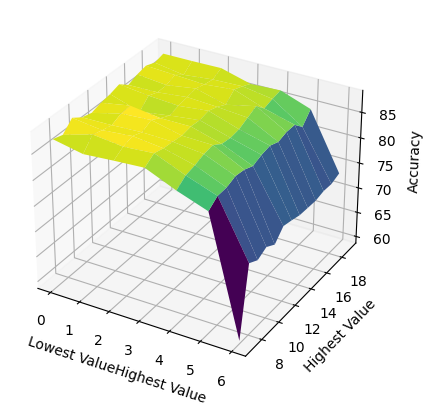

In [20]:
highest_values = np.arange(7, 20, 1)
lowest_values = np.arange(0, 7, 1)

best_accuracy = 0
best_highest_value = None
best_lowest_value = None

results = np.zeros((len(highest_values), len(lowest_values)))

for i, highest_value in enumerate(highest_values):
    for j, lowest_value in enumerate(lowest_values):
        accuracy = train_and_evaluate_nn_keras(X, y_encoded, highest_value, lowest_value, 0.2, 250)
        accuracy_percentage = round(accuracy * 100, 2)

        results[i, j] = accuracy_percentage

        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_highest_value = highest_value
            best_lowest_value = lowest_value

best_accuracy_percentage = round(best_accuracy * 100, 2)

print(f"Best highest value: {best_highest_value}")
print(f"Best lowest value: {best_lowest_value}")
print(f"Best accuracy: {best_accuracy_percentage}%")

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Create a meshgrid for the surface plot
highest_values_mesh, lowest_values_mesh = np.meshgrid(highest_values, lowest_values)

# Plot the surface
ax.plot_surface( lowest_values_mesh,highest_values_mesh, results.T, cmap='viridis', edgecolor='none')

ax.set_xlabel('Lowest Value''Highest Value')
ax.set_ylabel('Highest Value')
ax.set_zlabel('Accuracy')

plt.show()

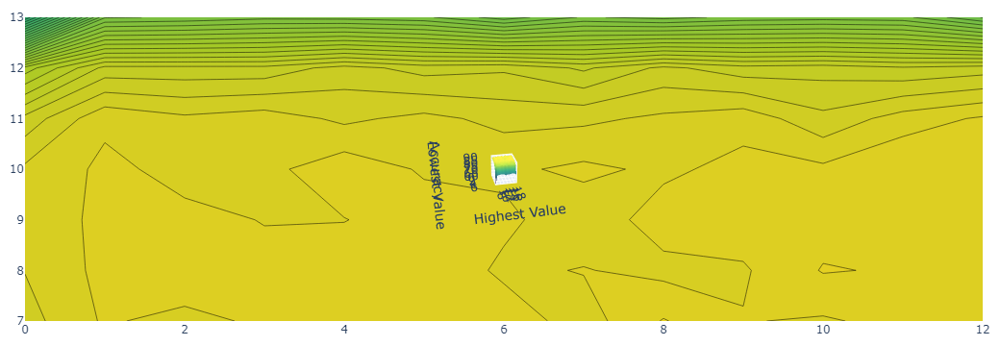

In [12]:
import plotly.graph_objects as go

# Create the meshgrid for the surface plot
highest_values_mesh, lowest_values_mesh = np.meshgrid(highest_values, lowest_values)

# Create the surface plot
fig = go.Figure(go.Surface(
    x=lowest_values_mesh,
    y=highest_values_mesh,
    z=results.T,
    colorscale='viridis',
    showscale=False,
    opacity=0.9
))

# Add a filled contour plot below the surface plot
fig.add_trace(go.Contour(
    x=lowest_values,
    y=highest_values,
    z=results.T,
    colorscale='viridis',
    contours=dict(start=0, end=np.amax(results), size=1),
    showscale=False,
    opacity=1,
    line_smoothing=0
))

# Update the layout
fig.update_layout(
    scene=dict(
        xaxis_title='Lowest Value',
        yaxis_title='Highest Value',
        zaxis_title='Accuracy',
        bgcolor='rgba(0, 0, 0, 0.1)'
    ),
    margin=dict(r=10, l=10, b=10, t=10)
)

fig.show()


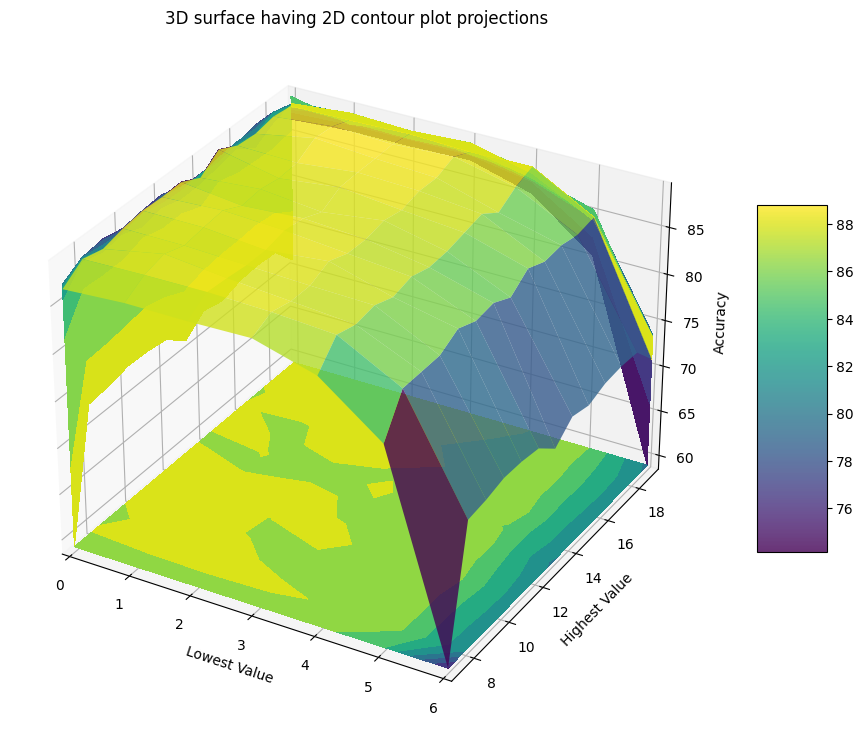

In [25]:

# Create the meshgrid for the surface plot
highest_values_mesh, lowest_values_mesh = np.meshgrid(highest_values, lowest_values)

# Height of the function at each point in the grid
z = results.T

# Creating figure
fig = plt.figure(figsize=(14, 9))
ax = plt.axes(projection='3d')

# Creating color map
my_cmap = plt.get_cmap('viridis')

# Creating plot
surf = ax.plot_surface(lowest_values_mesh, highest_values_mesh, z,
                       rstride=1,
                       cstride=1,
                       alpha=0.8,
                       cmap=my_cmap)
cset = ax.contourf(lowest_values_mesh, highest_values_mesh, z,
                   zdir='z',
                   offset=np.min(z),
                   cmap=my_cmap)
cset = ax.contourf(lowest_values_mesh, highest_values_mesh, z,
                   zdir='x',
                   offset=lowest_values[0],
                   cmap=my_cmap)
cset = ax.contourf(lowest_values_mesh, highest_values_mesh, z,
                   zdir='y',
                   offset=highest_values[-1],
                   cmap=my_cmap)
fig.colorbar(surf, ax=ax,
             shrink=0.5,
             aspect=5)
# Adding labels
ax.set_xlabel('Lowest Value')
ax.set_xlim(lowest_values[0], lowest_values[-1])
ax.set_ylabel('Highest Value')
ax.set_ylim(highest_values[0], highest_values[-1])
ax.set_zlabel('Accuracy')
ax.set_zlim(np.min(z), np.max(z))
ax.set_title('3D surface having 2D contour plot projections')

# Show plot
plt.show()


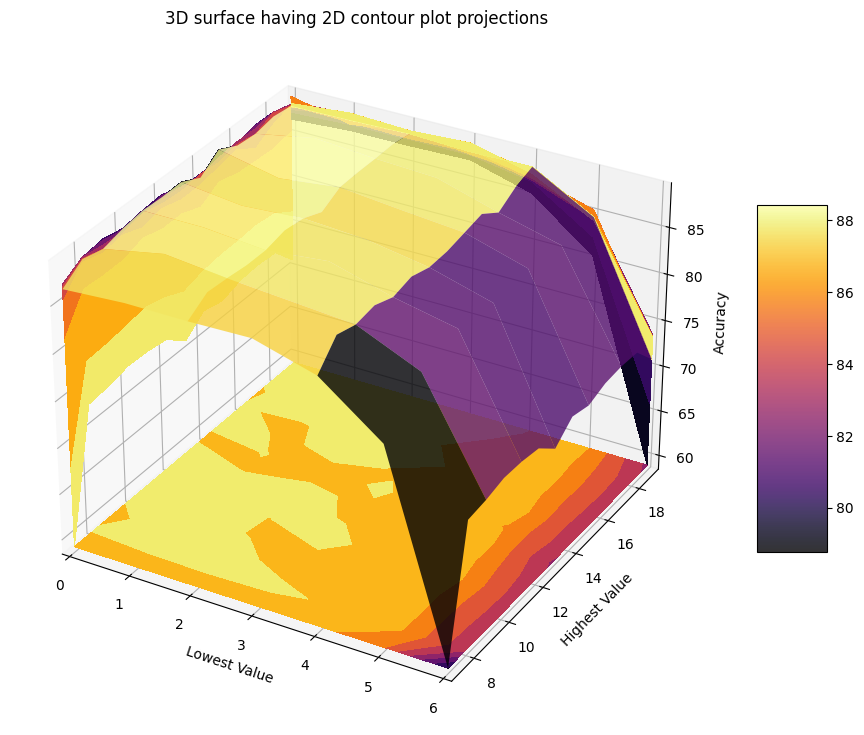

In [22]:
# Create the meshgrid for the surface plot
highest_values_mesh, lowest_values_mesh = np.meshgrid(highest_values, lowest_values)

# Height of the function at each point in the grid
z = results.T

# Creating figure
fig = plt.figure(figsize=(14, 9))
ax = plt.axes(projection='3d')

# Creating color map
my_cmap = plt.get_cmap('inferno')

# Creating plot
surf = ax.plot_surface(lowest_values_mesh, highest_values_mesh, z,
                       rstride=2,
                       cstride=2,
                       alpha=0.8,
                       cmap=my_cmap)
cset = ax.contourf(lowest_values_mesh, highest_values_mesh, z,
                   zdir='z',
                   offset=np.min(z),
                   cmap=my_cmap)
cset = ax.contourf(lowest_values_mesh, highest_values_mesh, z,
                   zdir='x',
                   offset=lowest_values[0],
                   cmap=my_cmap)
cset = ax.contourf(lowest_values_mesh, highest_values_mesh, z,
                   zdir='y',
                   offset=highest_values[-1],
                   cmap=my_cmap)
fig.colorbar(surf, ax=ax,
             shrink=0.5,
             aspect=5)

# Adding labels
ax.set_xlabel('Lowest Value')
ax.set_xlim(lowest_values[0], lowest_values[-1])
ax.set_ylabel('Highest Value')
ax.set_ylim(highest_values[0], highest_values[-1])
ax.set_zlabel('Accuracy')
ax.set_zlim(np.min(z), np.max(z))
ax.set_title('3D surface having 2D contour plot projections')

# Show plot
plt.show()

In [ ]:
# Create the meshgrid for the surface plot
highest_values_mesh, lowest_values_mesh = np.meshgrid(highest_values, lowest_values)

# Height of the function at each point in the grid
z = results.T

# Creating figure
fig = plt.figure(figsize=(14, 9))
ax = plt.axes(projection='3d')

# Creating color map
my_cmap = plt.get_cmap('inferno')

# Creating plot
surf = ax.plot_surface(lowest_values_mesh, highest_values_mesh, z,
                       rstride=2,
                       cstride=2,
                       alpha=0.8,
                       cmap=my_cmap)
cset = ax.contourf(lowest_values_mesh, highest_values_mesh, z,
                   zdir='z',
                   offset=np.min(z),
                   cmap=my_cmap)
cset = ax.contourf(lowest_values_mesh[::-1], highest_values_mesh, z[:, ::-1],
                   zdir='x',
                   offset=lowest_values[0],
                   cmap=my_cmap)
cset = ax.contourf(lowest_values_mesh, highest_values_mesh, z,
                   zdir='y',
                   offset=highest_values[-1],
                   cmap=my_cmap)
fig.colorbar(surf, ax=ax,
             shrink=0.5,
             aspect=5)

# Adding labels
ax.set_xlabel('Lowest Value')
ax.set_xlim(lowest_values[0], lowest_values[-1])
ax.set_ylabel('Highest Value')
ax.set_ylim(highest_values[0], highest_values[-1])
ax.set_zlabel('Accuracy')
ax.set_zlim(np.min(z), np.max(z))
ax.set_title('3D surface having 2D contour plot projections')

# Show plot
plt.show()


### Iterate through number of neurons in first dense layer of the NN.

In [11]:
from keras import backend as K

def train_and_evaluate_nn_keras(X, y, highest_value, lowest_value, split_size, num_neurons):
    # Filter the dataset based on the highest_value and lowest_value
    selected_neurons_mask = (~(X > highest_value).any(axis=0)) & ((X > lowest_value).any(axis=0))
    X_filtered = X.loc[:, selected_neurons_mask]

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X_filtered, y, test_size=split_size, random_state=42)

    # Create the neural network
    model = Sequential()
    model.add(Dense(num_neurons, input_dim=X_train.shape[1], activation='sigmoid'))
    model.add(Dense(num_classes, activation='softmax'))

    # Compile the model
    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

    # Train the neural network
    model.fit(X_train, y_train, epochs=200, batch_size=64, verbose=0)

    # Evaluate the model on the test set
    _, accuracy = model.evaluate(X_test, y_test, verbose=0)
    
    # Delete the model object to free up memory
    del model

    # Clear the TensorFlow backend to free up memory
    K.clear_session()

    return accuracy

In [12]:
neurons_range = range(0, 2000, 100)
neurons_range

range(0, 2000, 100)

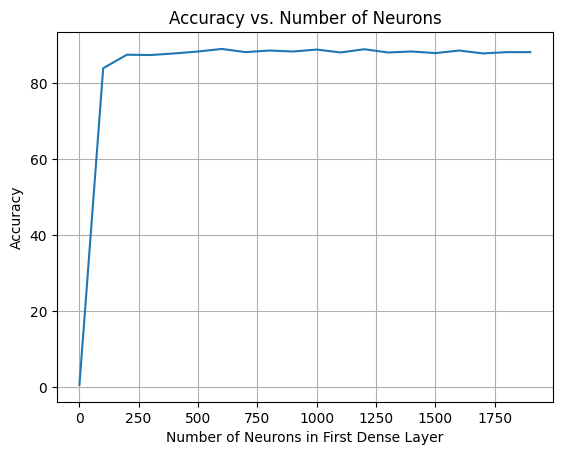

In [13]:
import gc

neurons_range = range(1, 2000, 100)
results = []

for num_neurons in neurons_range:
    accuracy = train_and_evaluate_nn_keras(X, y_encoded, 8, 2, 0.2, num_neurons)
    results.append((num_neurons, accuracy))
    #print(f"{num_neurons} neurons: {np.round(accuracy * 100, 2)}%")
    
    # Trigger garbage collection manually
    gc.collect()

# Extract the data from the results list
neurons = [result[0] for result in results]
accuracies = [result[1] * 100 for result in results]

# Create a line plot
plt.plot(neurons, accuracies)
plt.xlabel('Number of Neurons in First Dense Layer')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Number of Neurons')
plt.grid(True)
plt.show()


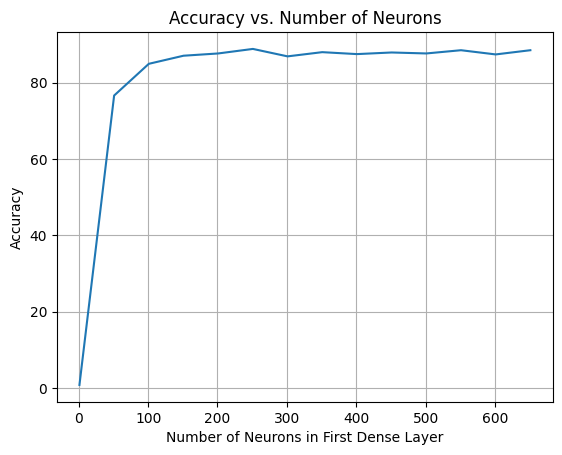

In [14]:
neurons_range = range(1, 701, 50)
results = []

for num_neurons in neurons_range:
    accuracy = train_and_evaluate_nn_keras(X, y_encoded, 8, 2, 0.2, num_neurons)
    results.append((num_neurons, accuracy))
    #print(f"{num_neurons} neurons: {np.round(accuracy * 100, 2)}%")
    
    # Trigger garbage collection manually
    gc.collect()

# Extract the data from the results list
neurons = [result[0] for result in results]
accuracies = [result[1] * 100 for result in results]

# Create a line plot
plt.plot(neurons, accuracies)
plt.xlabel('Number of Neurons in First Dense Layer')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Number of Neurons')
plt.grid(True)
plt.show()


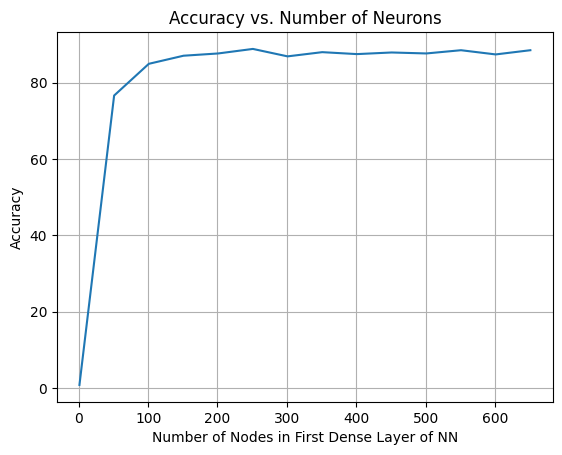

In [40]:
# Create a line plot
plt.plot(neurons, accuracies)
plt.xlabel('Number of Nodes in First Dense Layer of NN')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Number of Neurons')
plt.grid(True)
plt.show()

### Test different hyperparameters

In [ ]:
from tensorflow.keras.utils import to_categorical

# Helper function to train and evaluate the neural network with custom loss and activation functions
def train_and_evaluate_nn_keras(X, y, highest_value, lowest_value, split_size, num_neurons, loss_function, activation_function):
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=split_size, random_state=42)

    # Create the neural network
    model = Sequential()
    model.add(Dense(num_neurons, input_dim=X_train.shape[1], activation=activation_function))
    model.add(Dense(num_classes, activation='softmax'))

    # Compile the model
    model.compile(optimizer='adam', loss=loss_function, metrics=['accuracy'])

    # Train the neural network
    model.fit(X_train, y_train, epochs=200, batch_size=64, verbose=0)

    # Evaluate the model on the test set
    _, accuracy = model.evaluate(X_test, y_test, verbose=0)

    return accuracy

# Define the loss functions and activation functions to iterate through
loss_functions = ['categorical_crossentropy', 'mean_squared_error']
activation_functions = ['relu', 'tanh', 'sigmoid']

# Initialize an empty list to store the results
results = []

for loss_function in loss_functions:
    for activation_function in activation_functions:
        accuracy = train_and_evaluate_nn_keras(X, y_encoded, 8, 2, 0.2, 250, loss_function, activation_function)
        results.append((loss_function, activation_function, accuracy))
        print(f"Loss function: {loss_function}, Activation function: {activation_function}, Accuracy: {np.round(accuracy * 100, 2)}%")

In [ ]:
from tensorflow.keras.utils import to_categorical

# Helper function to train and evaluate the neural network with custom loss and activation functions
def train_and_evaluate_nn_keras(X, y, highest_value, lowest_value, split_size, num_neurons, loss_function, activation_function):
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=split_size, random_state=42)

    # Create the neural network
    model = Sequential()
    model.add(Dense(num_neurons, input_dim=X_train.shape[1], activation=activation_function))
    model.add(Dense(num_classes, activation='softmax'))

    # Compile the model
    model.compile(optimizer='adam', loss=loss_function, metrics=['accuracy'])

    # Train the neural network
    model.fit(X_train, y_train, epochs=200, batch_size=64, verbose=0)

    # Evaluate the model on the test set
    _, accuracy = model.evaluate(X_test, y_test, verbose=0)

    return accuracy

# Define the loss functions and activation functions to iterate through
loss_functions = ['categorical_crossentropy', 'mean_squared_error']
activation_functions = ['relu', 'tanh', 'sigmoid']

# Initialize an empty list to store the results
results = []

for loss_function in loss_functions:
    for activation_function in activation_functions:
        accuracy = train_and_evaluate_nn_keras(X, y_encoded, 8, 2, 0.2, 250, loss_function, activation_function)
        results.append((loss_function, activation_function, accuracy))
        print(f"Loss function: {loss_function}, Activation function: {activation_function}, Accuracy: {np.round(accuracy * 100, 2)}%")

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from tensorflow.keras.optimizers import SGD, RMSprop, Adam

def train_and_evaluate_nn_keras(X, y, split_size, num_neurons, batch_size, optimizer):
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=split_size, random_state=42)

    # Create the neural network
    model = Sequential()
    model.add(Dense(num_neurons, input_dim=X_train.shape[1], activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))

    # Compile the model
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    # Train the neural network
    model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0)

    # Evaluate the model on the test set
    _, accuracy = model.evaluate(X_test, y_test, verbose=0)

    return accuracy


# List of batch sizes and optimizers
batch_sizes = [16, 32, 64, 128]
optimizers = [
    {'name': 'SGD', 'optimizer': SGD()},
    {'name': 'RMSprop', 'optimizer': RMSprop()},
    {'name': 'Adam', 'optimizer': Adam()}
]

results = []

for batch_size in batch_sizes:
    for opt in optimizers:
        accuracy = train_and_evaluate_nn_keras(X, y_encoded, 0.2, 1000, batch_size, opt['optimizer'])
        accuracy_percentage = round(accuracy * 100, 2)

        results.append({
            'batch_size': batch_size,
            'optimizer': opt['name'],
            'accuracy': accuracy_percentage
        })

        print(f"Batch size: {batch_size}, Optimizer: {opt['name']}, Accuracy: {accuracy_percentage}%")

# Plot the results
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

optimizer_data = [optimizers.index(result['optimizer']) for result in results]
batch_size_data = [result['batch_size'] for result in results]
accuracies_data = [result['accuracy'] for result in results]

norm = plt.Normalize(min(accuracies_data), max(accuracies_data))
colors = plt.cm.viridis(norm(accuracies_data))

scatter = ax.scatter(optimizer_data, batch_size_data, accuracies_data, c=colors)
ax.set_xticks(range(len(optimizers)))
ax.set_xticklabels([opt['name'] for opt in optimizers])
ax.set_xlabel('Optimizer')
ax.set_ylabel('Batch Size')
ax.set_zlabel('Accuracy')

# Add a colorbar for better visualization
cbar = fig.colorbar(scatter, ax=ax, pad=0.1)
cbar.ax.set_ylabel('Accuracy', rotation=270, labelpad=10)

plt.show()

### Try a CNN

In [ ]:
from tensorflow.keras.layers import Conv1D, MaxPooling1D
from tensorflow.keras.layers import Flatten



def build_cnn_model(num_filters, kernel_size, activation_fn, input_shape, num_classes):
    model = Sequential([
        Conv1D(num_filters, kernel_size, activation=activation_fn, input_shape=input_shape),
        MaxPooling1D(),
        Flatten(),
        Dense(num_classes, activation='softmax')
    ])
    return model

# Set the input shape and number of classes
input_shape = (X_train.shape[1], 1)
num_classes = y_encoded.shape[1]

# CNN model
num_filters = 1000
kernel_size = 3
activation_fn = 'relu'

cnn_model = build_cnn_model(num_filters, kernel_size, activation_fn, input_shape, num_classes)
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train and evaluate the CNN model
cnn_model.fit(X_train, y_train, epochs=200, batch_size=64, verbose=0)
cnn_accuracy = cnn_model.evaluate(X_test, y_test, verbose=0)[1]

print("CNN Accuracy:", np.round(cnn_accuracy, 2))

### Graph GCN

White Paper: https://arxiv.org/pdf/1609.02907.pdf

Documentation: https://pypi.org/project/spektral/

### Model architecture

1. **Input**: The input to the model consists of two parts:
   * Node features (H<sup>(0)</sup>): An N x F matrix, where N is the number of nodes in the graph and F is the number of features per node.
   * Adjacency matrix (A): An N x N matrix, where A<sub>ij</sub> represents the connection between nodes i and j.

2. **Graph Convolutional Layers**: The model contains L Graph Convolutional layers, where L is the depth of the network. Each layer performs the following operation:

   f(H<sup>(l-1)</sup>, A) = ReLU(D<sup>(-1/2)</sup> * A * D<sup>(-1/2)</sup> * H<sup>(l-1)</sup> * W<sup>(l)</sup>)

   Here, D is the degree matrix of the graph, which is a diagonal matrix where D<sub>ii</sub> is the degree (number of connections) of node i. The matrix W<sup>(l)</sup> is the weight matrix for layer l.

3. **Classification Layer**: The output of the final Graph Convolutional layer is fed into a classification layer, which uses a softmax activation function to predict the class probabilities for each node.

### Key features

* **Local Connectivity**: The Graph Convolutional layers are designed to aggregate information from a node's local neighborhood, which enables the model to capture local patterns in the data.
* **Invariant to node order**: The operations performed in the GCN model are invariant to the order of the nodes in the graph, making the model robust to different node orderings.
* **Scalability**: The GCN model is scalable to large graphs, as the computational complexity of each layer is linear in the number of edges in the graph.
* **Semi-supervised learning**: The model can leverage both labeled and unlabeled data during training, which is especially useful when labeled data is scarce.



In [174]:
from scipy.spatial.distance import pdist, squareform

x_arr = X.columns.values
np_xyz = normalized_xyz.to_numpy()

# Get the indices of the rows in the array where the unit in the fourth column is not in the X columns list
indices_to_remove = []
for i in range(np_xyz.shape[0]):
    if str(int(np_xyz[i, 3])) not in x_arr:
        indices_to_remove.append(i)

# Remove the rows from the array that have indices in the indices_to_remove list
trimmed_arr_xyz = np.delete(np_xyz, indices_to_remove, axis=0)
trimmed_xyz = pd.DataFrame(trimmed_arr_xyz)

# Get the coordinates as a numpy array
coordinates = trimmed_xyz[[0, 1, 2]].values

# Compute the pairwise Euclidean distances
euclidean_distances = pdist(coordinates, metric='euclidean')

# Convert the condensed distance matrix to a square matrix
euclidean_distances_matrix = squareform(euclidean_distances)

# If you want to convert the distances to a DataFrame:
euclidean_distances_df = pd.DataFrame(euclidean_distances_matrix, columns=x_arr, index=x_arr)
euclidean_distances_df

,950910319,950910311,950910345,950910364,950910371,950910385,950912700,950910406,950910413,950910420,...,950956193,950957282,950956373,950956449,950956435,950956504,950956541,950956766,950956667,950956952
950910319,0.000000,0.000000,0.790518,0.790512,1.581024,0.792416,0.077745,0.796243,0.116856,1.584848,...,3.299166,3.299166,3.023399,3.018662,3.329913,3.057273,3.057273,2.970996,3.119903,3.149852
950910311,0.000000,0.000000,0.790518,0.790512,1.581024,0.792416,0.077745,0.796243,0.116856,1.584848,...,3.299166,3.299166,3.023399,3.018662,3.329913,3.057273,3.057273,2.970996,3.119903,3.149852
950910345,0.790518,0.790518,0.000000,1.580552,2.370905,0.038665,0.792416,0.077745,0.796243,2.372814,...,3.733927,3.733927,2.906988,3.304564,3.760903,2.941924,2.941924,3.063179,3.006422,3.423871
950910364,0.790512,0.790512,1.580552,0.000000,0.790512,1.581029,0.792433,1.582474,0.796273,0.796243,...,2.992162,2.992162,3.309966,2.903298,3.025769,3.340700,3.340700,3.064361,3.397650,3.038437
950910371,1.581024,1.581024,2.370905,0.790512,0.000000,2.370908,1.581036,2.371554,1.582487,0.077987,...,2.876003,2.876003,3.744413,2.999296,2.910679,3.771398,3.771398,3.347181,3.821527,3.129289
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
950956504,3.057273,3.057273,2.941924,3.340700,3.771398,2.921758,3.015959,2.899491,2.994649,3.737830,...,2.371819,2.371819,0.043879,1.581242,2.370959,0.000000,0.000000,0.790580,0.084690,1.585581
950956541,3.057273,3.057273,2.941924,3.340700,3.771398,2.921758,3.015959,2.899491,2.994649,3.737830,...,2.371819,2.371819,0.043879,1.581242,2.370959,0.000000,0.000000,0.790580,0.084690,1.585581
950956766,2.970996,2.970996,3.063179,3.064361,3.347181,3.043556,2.927915,3.021917,2.905678,3.308822,...,1.583140,1.583140,0.793012,0.793247,1.581242,0.790580,0.790580,0.000000,0.792769,0.797134
950956667,3.119903,3.119903,3.006422,3.397650,3.821527,2.985643,3.077367,2.962770,3.055431,3.786714,...,2.375754,2.375754,0.128501,1.585970,2.373334,0.084690,0.084690,0.792769,0.000000,1.581097


In [183]:
 import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from spektral.data import Graph
from spektral.layers import GCNConv
from spektral.utils import normalized_adjacency
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Input, Dropout
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.metrics import SparseCategoricalAccuracy
from spektral.utils import normalized_adjacency

# Set the threshold
threshold = 0.8

# Get the indices of the points in the adjacency matrix
indices_in_adj_matrix = [str(int(x)) for x in x_arr]

# Filter the X DataFrame to keep only the rows with indices in indices_in_adj_matrix
X = X[X.index.isin(indices_in_adj_matrix)]

# Create adjacency matrix from the DataFrame
adj_matrix = (euclidean_distances_df < threshold).astype(float)

# Convert the adjacency matrix to a numpy array
adj_matrix_numpy = adj_matrix.to_numpy()


# Convert DataFrames to NumPy arrays
X_np = X.to_numpy()
y_np = y.to_numpy()

# Create the graph
graph = Graph(x=X_np, a=adj_matrix_numpy, y=y_np)

# Define the GCN model
class GCN(Model):
    def __init__(self, n_hidden, n_classes):
        super().__init__()
        self.graph_conv1 = GCNConv(n_hidden)
        self.dropout = Dropout(0.5)
        self.graph_conv2 = GCNConv(n_classes)

    def call(self, inputs, training=None):
        x, a = inputs
        x = self.graph_conv1([x, a])
        x = tf.keras.activations.relu(x)
        x = self.dropout(x, training=training)
        x = self.graph_conv2([x, a])
        return tf.keras.activations.softmax(x)

# Set the model parameters
n_hidden = 64
n_classes = len(np.unique(y))
model = GCN(n_hidden, n_classes)

# Compile the model
optimizer = Adam(lr=0.01)
loss_fn = SparseCategoricalCrossentropy(from_logits=False)
acc_fn = SparseCategoricalAccuracy()
model.compile(optimizer=optimizer, loss=loss_fn, metrics=[acc_fn])
# Filter the y DataFrame to keep only the rows with indices in indices_in_adj_matrix
y = y[y.index.isin(indices_in_adj_matrix)]

# Prepare the data
X_train, X_test, y_train, y_test = train_test_split(adj_matrix_numpy, graph.y, test_size=0.2, random_state=42)
A_train, A_test = graph.a, graph.a

# Train the model
model.fit([X_train, A_train], y_train, validation_data=([X_test, A_test], y_test), epochs=100, batch_size=1)



ValueError: Found input variables with inconsistent numbers of samples: [1144, 0]

In [177]:

print("X_train shape:", X_train.shape)
print("A_train shape:", A_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("A_test shape:", A_test.shape)
print("y_test shape:", y_test.shape)
print(adj_matrix.shape)


X_train shape: (4720, 1144)
A_train shape: (1144, 1144)
y_train shape: (4720,)
X_test shape: (1180, 1144)
A_test shape: (1144, 1144)
y_test shape: (1180,)
(1144, 1144)


In [173]:
A = euclidean_distances_df.loc[X.index, X.index]


KeyError: 'None of [RangeIndex(start=0, stop=5900, step=1)] are in the [index]'